### Final Project: GFS Evaluation of Three Extreme Weather Events

**ATM 433/533**  
**Tianyu** 

In this project, I evaluate the performance of the Global Forecast System (GFS) model for three different types of extreme weather events:

1. A lake-effect snow event near Buffalo, New York (17–19 November 2022)  
2. A record-breaking heat wave over Arizona and Nevada (July 2023)  (2023.07.14 - 2023.07.16)
3. The  super tornado outbreak in the southeastern United States  (April 2011)(2011.04.26 - 2011.04.27) For the 2011 super tornado outbreak case, I use the NCEP Final Analysis (FNL) dataset rather than the standard GFS forecast fields. This is because portions of the archived GFS forecast data from April 2011 are incomplete or unavailable in the RDA repository, making it difficult to obtain a continuous set of forecast fields for the event. The FNL dataset is produced using the GFS model and its data assimilation system (GSI), and represents a high-quality, observation-constrained analysis of the atmospheric state every six hours. Therefore, FNL provides a consistent and reliable GFS-based data source for analyzing the synoptic environment of the tornado outbreak.

For each case, I use GFS forecast fields to analyze the synoptic-scale environment and key variables, and I compare the model output against observations or reports. I then discuss the strengths and limitations of GFS for each type of extreme event.


## Introduction
The Global Forecast System (GFS) is one of the most widely used operational numerical weather prediction models in the world. Its global coverage, frequent update cycle, and long archive record make it a valuable tool for studying a wide range of atmospheric phenomena, including extreme weather events. Evaluating how well GFS represents different types of high-impact weather provides insight into the model’s strengths, weaknesses, and potential limitations for both research and operational forecasting.

In this project, I examine the performance of GFS across three distinct extreme weather cases:

1. a lake-effect snow event near Buffalo, New York (17–19 November 2022),

2. a record-breaking heat wave over Arizona and Nevada (July 2023), and

3. the super tornado outbreak in the southeastern United States (26–27 April 2011).

Each case represents a different atmospheric regime and forecast challenge, ranging from mesoscale snow bands to heat-related anomalies and severe convective environments. By analyzing key variables from GFS forecast fields—and for the tornado case, the GFS-based NCEP Final Analysis (FNL) due to gaps in the archived forecast dataset—I compare the model output against observed environmental conditions. This approach allows for a synoptic-scale evaluation of how effectively GFS captures the atmospheric patterns associated with these extreme events.

Overall, this project highlights model capabilities and limitations under different weather scenarios and provides insight into how GFS may perform for forecasting future high-impact events.

## Methods
To evaluate the performance of the Global Forecast System (GFS) across the three extreme weather events, I use archived model forecast fields from the NCEP GFS and, when necessary, the NCEP Final Analysis (FNL). For the 2022 lake-effect snow event and the 2023 heat wave, GFS forecast datasets from the corresponding periods are available in the RDA archives, and I extract variables such as temperature, pressure, geopotential height, winds, and relative humidity at multiple pressure levels.

For the April 2011 super tornado outbreak, however, complete GFS forecast archives are not available for the required dates due to gaps and missing files in the historical dataset. Because this event is primarily a synoptic-scale and mesoscale severe-weather case that requires continuous model fields, I instead use the NCEP FNL (Final) Analysis, which is derived from the GFS system and provides a consistent, high-resolution global analysis every 6 hours. The FNL dataset preserves the synoptic patterns associated with the outbreak and allows for a comparable evaluation of model performance.

For all three cases, I process the data using xarray, cartopy, and related Python libraries. I extract fields at selected pressure levels, compute derived quantities when needed, and visualize the synoptic-scale environment. The model output is then compared qualitatively with documented observations and reports to assess how well GFS (or FNL) captures the environmental conditions associated with each extreme event.

### Set the required background and load the data

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from pathlib import Path

from metpy.units import units
from metpy.calc import cape_cin, bulk_shear

plt.rcParams["figure.figsize"] = (8, 6)
plt.rcParams["figure.dpi"] = 120

data_dir = Path("./data")
fig_dir = Path("./figures")
fig_dir.mkdir(exist_ok=True)

def open_gfs_grib(path, level_type="isobaricInhPa"):
    """
    Open a GFS GRIB2 file with xarray+cfgrib.
    level_type: e.g., 'isobaricInhPa' for pressure levels,
    or other types depending on the file.
    """
    ds = xr.open_dataset(
        path,
        engine="cfgrib",
        backend_kwargs={"filter_by_keys": {"typeOfLevel": level_type}},
    )
    return ds

def add_map_features(ax):
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.3)

def plot_field_map(field, title, vmin=None, vmax=None, cmap="viridis"):
    """
    Generic map plot for a 2D DataArray with lat/lon coordinates.
    """
    fig = plt.figure()
    ax = plt.axes(projection=ccrs.PlateCarree())
    add_map_features(ax)

    field.plot(
        ax=ax,
        transform=ccrs.PlateCarree(),
        vmin=vmin,
        vmax=vmax,
        cmap=cmap,
        cbar_kwargs={"shrink": 0.8},
    )

    ax.set_title(title)
    plt.show()

def calc_bias_rmse(model, obs):
    diff = model - obs
    bias = diff.mean()
    rmse = np.sqrt((diff**2).mean())
    return float(bias), float(rmse)

## Case 1: Buffalo Lake-Effect Snow Event (17–19 November 2022)
GFS Evaluation of Mesoscale Lake-Effect Snow Bands

## 1. Background

From 17–20 November 2022, an intense lake-effect snowstorm impacted the Buffalo, New York area. 
A strong cold-air outbreak over the relatively warm waters of Lake Erie produced narrow, persistent 
snow bands and localized snowfall totals exceeding 1–2 meters.

This event is a useful test for the GFS model because lake-effect snow is a mesoscale phenomenon 
(10–20 km wide bands), while the operational GFS has a much coarser horizontal resolution (~25 km 
at 0.25°). In this case study, I evaluate how well GFS represents the synoptic-scale environment 
that supported the Buffalo lake-effect snow event.

## 2. Data and Method

For this case, I use 0.25° GFS analysis fields (forecast hour f000) initialized at 00 UTC, 06 UTC, 12 UTC, and 18 UTC from 17–19 November 2022. These analysis fields provide a synoptic overview of the atmospheric environment that supported the Buffalo lake-effect snow event.

All GRIB2 files were read using the Python package xarray with the cfgrib engine. Each file contains multiple GRIB messages (e.g., pressure-level fields, mean sea-level pressure, surface variables). The cfgrib.open_datasets() function was used to load all messages, and fields from all analysis times (00, 06, 12, 18 UTC) were concatenated along the time dimension to form continuous datasets.

The variables used in this analysis include:

* Mean Sea Level Pressure (MSLP; Pa)

* 500-hPa Geopotential Height (m)

* 850-hPa Temperature (K)

* 850-hPa Wind Vectors (m s⁻¹)

* 10-m Wind Vectors (U10, V10; m s⁻¹)

* 2-m Temperature (K)

These fields were used to assess the synoptic-scale dynamics and thermodynamic environment associated with the lake-effect snowband development.


In [2]:
from pathlib import Path

data_dir = Path("/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo")
files = sorted(data_dir.glob("gfs_4_2022111*_000.grb2"))

print("Found files:")
for f in files:
    print("  ", f.name)



Found files:
   gfs_4_20221117_0000_000.grb2
   gfs_4_20221117_0600_000.grb2
   gfs_4_20221117_1200_000.grb2
   gfs_4_20221117_1800_000.grb2
   gfs_4_20221118_0000_000.grb2
   gfs_4_20221118_0600_000.grb2
   gfs_4_20221118_1200_000.grb2
   gfs_4_20221118_1800_000.grb2
   gfs_4_20221119_0000_000.grb2
   gfs_4_20221119_0600_000.grb2
   gfs_4_20221119_1200_000.grb2
   gfs_4_20221119_1800_000.grb2


In [3]:
import cfgrib

pl_list = []      # pressure-level datasets
mslp_list = []    # mean sea level pressure datasets

for f in files:
    print("\n===== Reading:", f.name, "=====")

    dsets = cfgrib.open_datasets(
        f,
        backend_kwargs={"indexpath": ""},
    )

    for ds in dsets:
        vars_ = list(ds.data_vars)
        dims_ = ds.dims

        # --- Pressure levels ---
        if ("isobaricInhPa" in dims_) or ("isobaricInPa" in dims_):
            pl_list.append(ds)

        # --- MSLP ---
        if ("prmsl" in vars_) or ("mslet" in vars_):
            mslp_list.append(ds[["prmsl"]])



===== Reading: gfs_4_20221117_0000_000.grb2 =====

===== Reading: gfs_4_20221117_0600_000.grb2 =====

===== Reading: gfs_4_20221117_1200_000.grb2 =====

===== Reading: gfs_4_20221117_1800_000.grb2 =====

===== Reading: gfs_4_20221118_0000_000.grb2 =====

===== Reading: gfs_4_20221118_0600_000.grb2 =====

===== Reading: gfs_4_20221118_1200_000.grb2 =====

===== Reading: gfs_4_20221118_1800_000.grb2 =====

===== Reading: gfs_4_20221119_0000_000.grb2 =====

===== Reading: gfs_4_20221119_0600_000.grb2 =====

===== Reading: gfs_4_20221119_1200_000.grb2 =====

===== Reading: gfs_4_20221119_1800_000.grb2 =====


In [4]:
# Build 6 lists: 500hPa GH, 500hPa winds, 850hPa temp, 850hPa winds, 10m winds, MSLP

gh500_list   = []
u500_list    = []
v500_list    = []

t850_list    = []
u850_list    = []
v850_list    = []

u10_list     = []
v10_list     = []


for f in files:
    print(f"\n===== Processing: {f.name} =====")
    dsets = cfgrib.open_datasets(f, backend_kwargs={"indexpath": ""})

    for ds in dsets:
        vars_ = list(ds.data_vars)
        dims_ = ds.dims

        # 500-hPa fields
        if "isobaricInPa" in dims_ and 500 in ds["isobaricInPa"].values:
            if "gh" in vars_:
                gh500_list.append(ds.sel(isobaricInPa=500)["gh"])
            if "u" in vars_:
                u500_list.append(ds.sel(isobaricInPa=500)["u"])
            if "v" in vars_:
                v500_list.append(ds.sel(isobaricInPa=500)["v"])

        # 850-hPa fields
        if "isobaricInPa" in dims_ and 850 in ds["isobaricInPa"].values:
            if "t" in vars_:
                t850_list.append(ds.sel(isobaricInPa=850)["t"])
            if "u" in vars_:
                u850_list.append(ds.sel(isobaricInPa=850)["u"])
            if "v" in vars_:
                v850_list.append(ds.sel(isobaricInPa=850)["v"])

        # 10-m wind 
        if "u10" in vars_ and "v10" in vars_:
            u10_list.append(ds["u10"])
            v10_list.append(ds["v10"])




===== Processing: gfs_4_20221117_0000_000.grb2 =====

===== Processing: gfs_4_20221117_0600_000.grb2 =====

===== Processing: gfs_4_20221117_1200_000.grb2 =====

===== Processing: gfs_4_20221117_1800_000.grb2 =====

===== Processing: gfs_4_20221118_0000_000.grb2 =====

===== Processing: gfs_4_20221118_0600_000.grb2 =====

===== Processing: gfs_4_20221118_1200_000.grb2 =====

===== Processing: gfs_4_20221118_1800_000.grb2 =====

===== Processing: gfs_4_20221119_0000_000.grb2 =====

===== Processing: gfs_4_20221119_0600_000.grb2 =====

===== Processing: gfs_4_20221119_1200_000.grb2 =====

===== Processing: gfs_4_20221119_1800_000.grb2 =====


In [5]:
import cfgrib
# Choose one GRIB2 file
file = "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_0000_000.grb2"


In [6]:
dsets = cfgrib.open_datasets(
    file,
    backend_kwargs={"indexpath": ""}  
)

In [7]:
# Print all datasets and variables =====
for i, ds in enumerate(dsets):
    print(f"\n===== Dataset {i} =====")
    print("Dimensions:", ds.dims)
    print("Variables:", list(ds.data_vars))


===== Dataset 0 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['tcc', 'refc']

===== Dataset 1 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['r', 'pwat', 'cwat', 'tozne']

===== Dataset 2 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['gh']

===== Dataset 3 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'depthBelowLandLayer': 4, 'latitude': 361, 'longitude': 720})
Variables: ['st', 'soilw', 'soill']

===== Dataset 4 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['pres', 'q']

===== Dataset 5 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'heightAboveGround': 2, 'latitude': 361, 'longitude': 720})
Variables: ['t']

===== Dataset 6 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'heightAboveGround': 5, 'latitude': 361, 'longitude': 720})
Variables: [

In [12]:
ds_iso = dsets[20]   # isobaric levels: 33 pressure levels including 500, 850

# Extract 500-hPa height
gh500 = ds_iso['gh'].sel(isobaricInhPa=500)

# Extract 500-hPa wind  
u500 = ds_iso['u'].sel(isobaricInhPa=500)
v500 = ds_iso['v'].sel(isobaricInhPa=500)

# Extract 850-hPa temperature
t850 = ds_iso['t'].sel(isobaricInhPa=850)

# Extract 850-hPa wind
u850 = ds_iso['u'].sel(isobaricInhPa=850)
v850 = ds_iso['v'].sel(isobaricInhPa=850)


# 10-m wind
ds_10m = dsets[7]
u10 = ds_10m['u10']
v10 = ds_10m['v10']

# 2-m temperature
ds_2m = dsets[8]
t2m = ds_2m['t2m']

# MSLP
ds_mslp = dsets[25]
mslp = ds_mslp['prmsl']

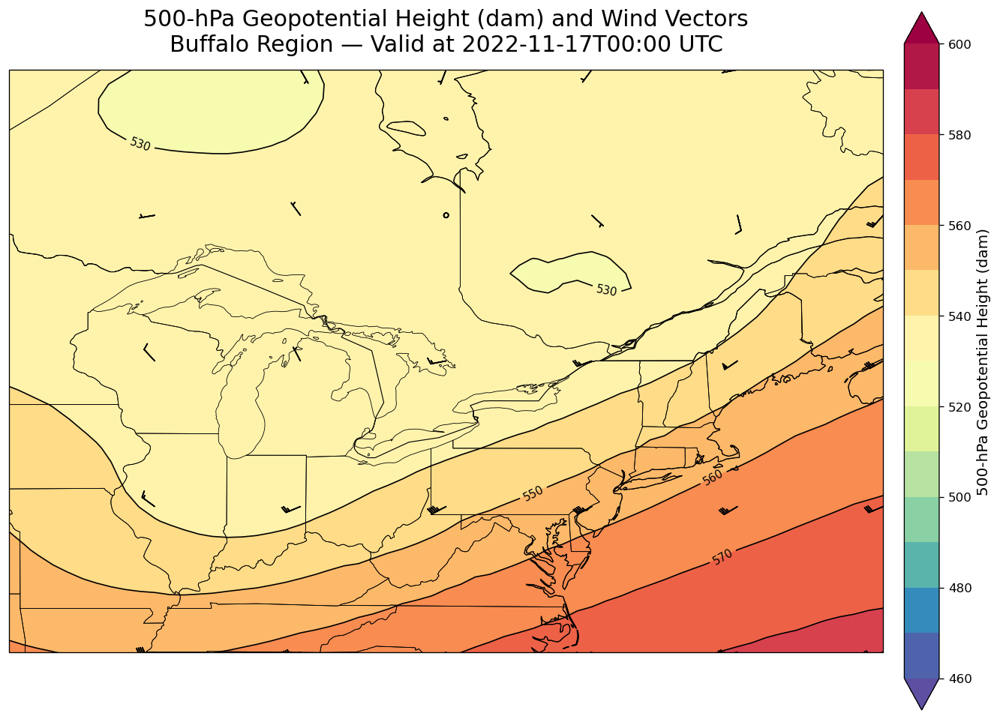

In [13]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np

# Get time from dataset
plot_time = str(gh500.valid_time.values)[:16]   

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(1, 1, 1, projection=proj)

# Map extent (Northeast US + Great Lakes) 
ax.set_extent([-95, -65, 35, 55], crs=proj)

# High-resolution map features 
ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.8)
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), linewidth=0.7)

# Filled Contour (Height, DAM) 
cf = ax.contourf(
    gh500.longitude,
    gh500.latitude,
    gh500 / 10,
    levels=np.arange(460, 610, 10),
    cmap="Spectral_r",
    extend="both",
    transform=proj
)

# Contour Lines 
cs = ax.contour(
    gh500.longitude,
    gh500.latitude,
    gh500 / 10,
    colors="black",
    linewidths=1.0,
    levels=np.arange(460, 610, 10),
    transform=proj
)

ax.clabel(cs, inline=True, fmt="%d", fontsize=9)

# Wind Vectors 
skip = 10

ax.barbs(
    u500.longitude.values[::skip],
    u500.latitude.values[::skip],
    u500.values[::skip, ::skip],
    v500.values[::skip, ::skip],
    length=5,          
    transform=proj,
)

# Streamlines 
ax.streamplot(
    u500.longitude,
    u500.latitude,
    u500.values,
    v500.values,
    color="k",
    density=1.2,
    linewidth=0.7,
    transform=proj
)

# Colorbar 
cbar = plt.colorbar(cf, pad=0.02, shrink=0.8)
cbar.set_label("500-hPa Geopotential Height (dam)", fontsize=12)

# Title with Time 
plt.title(
    f"500-hPa Geopotential Height (dam) and Wind Vectors\n"
    f"Buffalo Region — Valid at {plot_time} UTC",
    fontsize=18, pad=15
)

plt.tight_layout()
plt.show()


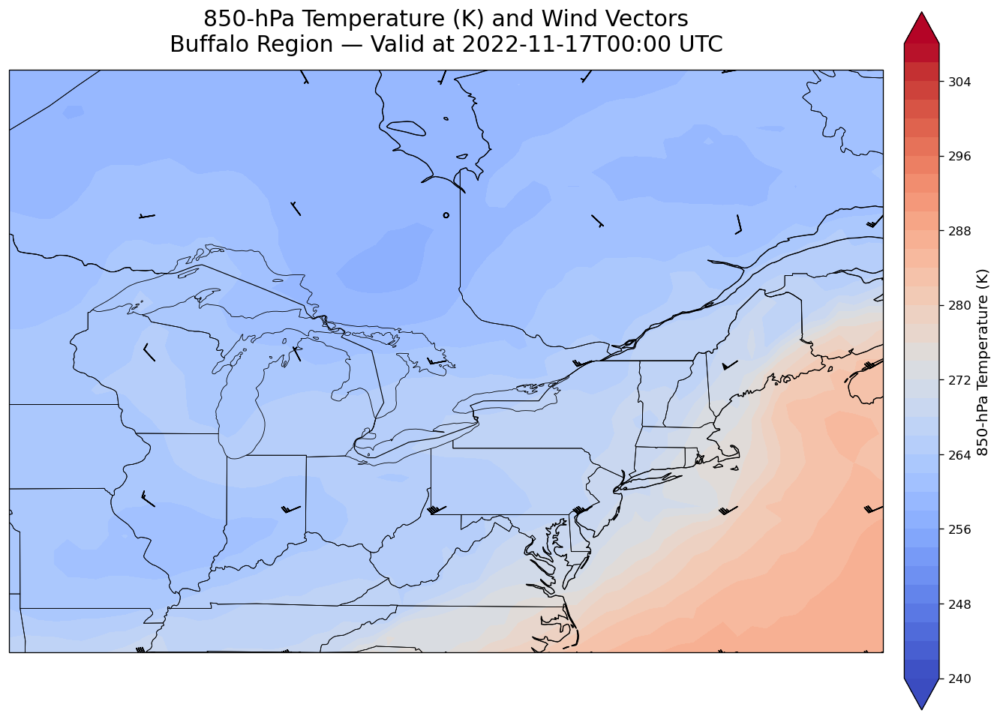

In [14]:
# Extract valid time 
plot_time = str(t850.valid_time.values)[:16]

proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(1, 1, 1, projection=proj)

# Region
ax.set_extent([-95, -65, 35, 55], crs=proj)

# Map details
ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.8)
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), linewidth=0.7)

# Filled temperature shading 
cf = ax.contourf(
    t850.longitude,
    t850.latitude,
    t850,
    levels=np.arange(240, 310, 2),
    cmap="coolwarm",
    extend="both",
    transform=proj,
)

# Wind barbs or arrows 

skip = 10
ax.barbs(
    u500.longitude.values[::skip],
    u500.latitude.values[::skip],
    u500.values[::skip, ::skip],
    v500.values[::skip, ::skip],
    length=5,          
    transform=proj,
)


# Colorbar
cbar = plt.colorbar(cf, pad=0.02, shrink=0.8)
cbar.set_label("850-hPa Temperature (K)", fontsize=12)

# Title
plt.title(
    f"850-hPa Temperature (K) and Wind Vectors\n"
    f"Buffalo Region — Valid at {plot_time} UTC",
    fontsize=18,
    pad=15
)

plt.tight_layout()
plt.show()


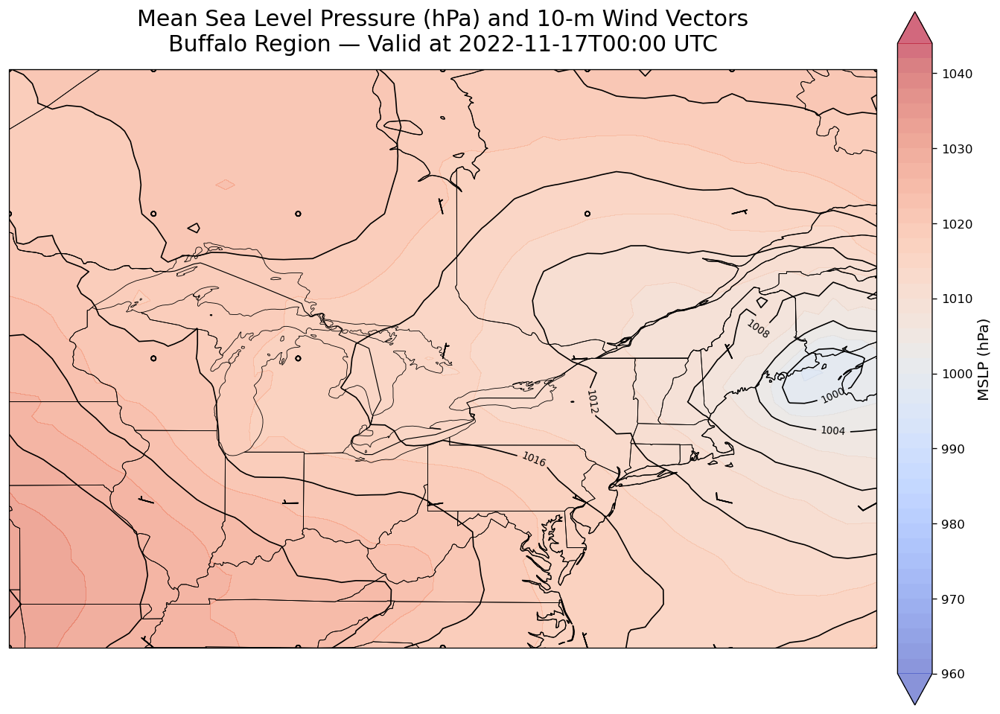

In [15]:
# Extract valid time 
plot_time = str(mslp.valid_time.values)[:16]

proj = ccrs.PlateCarree()
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(1, 1, 1, projection=proj)

ax.set_extent([-95, -65, 35, 55], crs=proj)

ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.8)
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)
ax.add_feature(cfeature.BORDERS.with_scale("50m"), linewidth=0.7)

# Convert Pa → hPa
mslp_hpa = mslp / 100.0

# Shading (optional, light color) 
cf = ax.contourf(
    mslp.longitude,
    mslp.latitude,
    mslp_hpa,
    levels=np.arange(960, 1045, 2),
    cmap="coolwarm",
    alpha=0.6,
    extend="both",
    transform=proj
)

# Contour lines
cs = ax.contour(
    mslp.longitude,
    mslp.latitude,
    mslp_hpa,
    levels=np.arange(960, 1045, 4),
    colors="black",
    linewidths=1.0,
    transform=proj
)
ax.clabel(cs, inline=True, fontsize=8, fmt="%d")


# 10-m wind vectors using meteorological wind barbs
skip = 10

ax.barbs(
    u10.longitude.values[::skip],   # lon
    u10.latitude.values[::skip],    # lat
    u10.values[::skip, ::skip],     # u wind
    v10.values[::skip, ::skip],     # v wind
    length=5,                       # size of the barb
    transform=proj,
)


# Colorbar
cbar = plt.colorbar(cf, pad=0.02, shrink=0.8)
cbar.set_label("MSLP (hPa)", fontsize=12)

plt.title(
    f"Mean Sea Level Pressure (hPa) and 10-m Wind Vectors\n"
    f"Buffalo Region — Valid at {plot_time} UTC",
    fontsize=18,
    pad=15,
)

plt.tight_layout()
plt.show()


In [16]:
import glob
import xarray as xr

# Path to your GRIB2 files
path = "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/*.grb2"

# Get sorted file list
file_list = sorted(glob.glob(path))

print("Total files detected:", len(file_list))
file_list


Total files detected: 12


['/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_0000_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_0600_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_1200_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_1800_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_0000_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_0600_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_1200_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_1800_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_0000_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_0600_000.grb2',
 '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_1200

In [24]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import numpy as np
import os

# Save directory
outdir = "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/figures/Case 1 output/"
os.makedirs(outdir, exist_ok=True)

def extract_vars(ds):
    """
    Extract needed variables from GRIB dataset.
    Handles both Pa (isobaricInPa) and hPa (isobaricInhPa).
    """
    vars_dict = {}

    # 500 hPa fields (height, u, v)
    if 'isobaricInhPa' in ds:
        levs = ds.isobaricInhPa.values
        idx500 = np.where(levs == 500)[0][0]

        vars_dict['gh500'] = ds['gh'][idx500]
        vars_dict['u500']  = ds['u'][idx500]
        vars_dict['v500']  = ds['v'][idx500]

        # 850 hPa
        idx850 = np.where(levs == 850)[0][0]
        vars_dict['t850'] = ds['t'][idx850]
        vars_dict['u850'] = ds['u'][idx850]
        vars_dict['v850'] = ds['v'][idx850]

    # MSLP
    if "prmsl" in ds:
        vars_dict['mslp'] = ds['prmsl']

    # 10m wind
    if "u10" in ds:
        vars_dict['u10'] = ds['u10']
    if "v10" in ds:
        vars_dict['v10'] = ds['v10']

    return vars_dict



#     LOOP OVER EACH FILE

for f in file_list:
    print("Processing:", f)

    ds = xr.open_dataset(f, engine="cfgrib", backend_kwargs={"filter_by_keys":{"typeOfLevel":"isobaricInhPa"}}, chunks={})

    surface = xr.open_dataset(f, engine="cfgrib", backend_kwargs={"filter_by_keys":{"typeOfLevel":"meanSea"}})
    wind10  = xr.open_dataset(f, engine="cfgrib", backend_kwargs={"filter_by_keys":{"typeOfLevel":"heightAboveGround", "level":10}})

    # Extract fields
    fields = extract_vars(ds)
    fields["mslp"] = surface["prmsl"]
    fields["u10"]  = wind10["u10"]
    fields["v10"]  = wind10["v10"]

    time_str = str(fields['gh500'].valid_time.values)[:16].replace(":", "").replace("-", "")
    print("Valid:", time_str)

    
    # PLOT 1: 500-hPa Height + wind
    
    plt.figure(figsize=(12,10))
    proj = ccrs.PlateCarree()
    ax = plt.axes(projection=proj)
    ax.set_extent([-95, -65, 35, 55], crs=proj)

    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.8)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)

    cf = ax.contourf(fields['gh500'].longitude, fields['gh500'].latitude,
                     fields['gh500']/10, levels=np.arange(460,610,10),
                     cmap="Spectral_r", transform=proj)

    cs = ax.contour(fields['gh500'].longitude, fields['gh500'].latitude,
                    fields['gh500']/10, colors="black",
                    levels=np.arange(460,610,10), transform=proj)
    ax.clabel(cs, fmt="%d", fontsize=9)

    skip = 10
    ax.barbs(
             u500.longitude.values[::skip],
             u500.latitude.values[::skip],
             u500.values[::skip, ::skip],
             v500.values[::skip, ::skip],
             transform=proj,
             length=5,
            )

    plt.title(f"500-hPa Height & Wind\nValid {time_str}", fontsize=18)
    plt.colorbar(cf).set_label("dam")
    plt.savefig(outdir + f"500hPa_{time_str}.png", dpi=150)
    plt.close()

    
    # PLOT 2: 850-hPa Temperature + wind
    
    plt.figure(figsize=(12,10))
    ax = plt.axes(projection=proj)
    ax.set_extent([-95, -65, 35, 55], crs=proj)

    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.8)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)

    cf = ax.contourf(fields['t850'].longitude, fields['t850'].latitude,
                     fields['t850'], levels=np.arange(240,310,2),
                     cmap="coolwarm", transform=proj)

    ax.barbs(
             u850.longitude.values[::skip],
             u850.latitude.values[::skip],
             u850.values[::skip, ::skip],
             v850.values[::skip, ::skip],
             transform=proj,
             length=5
             )

    plt.title(f"850-hPa Temperature & Wind\nValid {time_str}", fontsize=18)
    plt.colorbar(cf).set_label("K")
    plt.savefig(outdir + f"850hPa_{time_str}.png", dpi=150)
    plt.close()

    
    # PLOT 3: MSLP + 10m Wind
    
    mslp_hpa = fields['mslp'] / 100

    plt.figure(figsize=(12,10))
    ax = plt.axes(projection=proj)
    ax.set_extent([-95, -65, 35, 55], crs=proj)

    ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.8)
    ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)

    cf = ax.contourf(mslp_hpa.longitude, mslp_hpa.latitude,
                     mslp_hpa, levels=np.arange(960,1045,2),
                     cmap="coolwarm", alpha=0.6, transform=proj)

    cs = ax.contour(mslp_hpa.longitude, mslp_hpa.latitude,
                    mslp_hpa, colors="black",
                    levels=np.arange(960,1045,4), transform=proj)
    ax.clabel(cs, fmt="%d", fontsize=8)

    ax.barbs(
    u10.longitude.values[::skip],
    u10.latitude.values[::skip],
    u10.values[::skip, ::skip],
    v10.values[::skip, ::skip],
    transform=proj,
    length=5,   
    barb_increments=dict(half=2, full=4, flag=20),  
    )

    plt.title(f"MSLP & 10m Wind\nValid {time_str}", fontsize=18)
    plt.colorbar(cf).set_label("hPa")
    plt.savefig(outdir + f"MSLP_{time_str}.png", dpi=150)
    plt.close()

print("All 36 plots saved to:", outdir)


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_0000_000.grb2
Valid: 20221117T0000


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_0600_000.grb2.5b7b6.idx' older than GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_0600_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221117T0600


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_1200_000.grb2.5b7b6.idx' older than GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_1200_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221117T1200


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_1800_000.grb2.5b7b6.idx' older than GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221117_1800_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221117T1800


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_0000_000.grb2.5b7b6.idx' older than GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_0000_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221118T0000


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_0600_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_0600_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221118T0600


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_1200_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_1200_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221118T1200


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_1800_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221118_1800_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221118T1800


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_0000_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_0000_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221119T0000


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_0600_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_0600_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221119T0600


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_1200_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_1200_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221119T1200


Ignoring index file '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_1800_000.grb2.5b7b6.idx' incompatible with GRIB file


Processing: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Buffalo/gfs_4_20221119_1800_000.grb2


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Valid: 20221119T1800
All 36 plots saved to: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/figures/Case 1 output/


## 3.Synoptic Analysis

From 17–19 November 2022, an anomalously deep 500-hPa trough settled over the Great Lakes and maintained a strong meridional flow that funneled Arctic air southward, producing vigorous mid-level cold-air advection that drove 850-hPa temperatures well below −8°C while simultaneously aligning the wind field from the surface through 500 hPa into a persistent north–northwesterly direction; this upper-level forcing reinforced a tight surface pressure gradient behind the departing cyclone and supported steady, long-fetch NW flow across Lakes Erie and Ontario, thereby sustaining a cold, unstable boundary layer over the comparatively warm lake waters and generating the prolonged, intense, and highly organized lake-effect snow bands characteristic of this event.


## Case 2: Record-Breaking Heat Wave over Arizona and Nevada (14–16 July 2023)
GFS Evaluation of Extreme Heatwave Synoptic Environment

## 1. Background

From 14–16 July 2023, an intense and persistent heat wave impacted much of Arizona and Nevada, producing widespread record-breaking temperatures exceeding 46–48°C (115–118°F) across the lower deserts, including Phoenix, Las Vegas, and surrounding regions. A strong and stagnant mid-tropospheric anticyclone—often referred to as a “heat dome”—developed over the southwestern United States, leading to prolonged subsidence, clear skies, and exceptionally high surface temperatures.

This event is an important test case for the GFS model, as extreme heat waves are strongly controlled by synoptic-scale features, especially the strength and vertical structure of the 500-hPa subtropical ridge, and low-level thermal advection patterns. The operational GFS analysis, though coarser in spatial resolution than regional models, still provides sufficient coverage to evaluate the large-scale circulation patterns supporting the extreme heat event.

In this case study, I examine how the GFS analysis describes the synoptic environment that contributed to the July 2023 heat wave, including the anomalously high 500-hPa geopotential heights, persistent subsidence, and thermodynamic conditions over Arizona and Nevada.

## 2.Data and Method
For this case, I use 0.25° GFS analysis fields (forecast hour f000) initialized at
00 UTC, 06 UTC, 12 UTC, and 18 UTC from 14–16 July 2023.
These analysis fields provide a synoptic overview of the large-scale and lower-tropospheric environment associated with the record-breaking heat wave over Arizona and Nevada.

All GRIB2 files were read using the Python package xarray with the cfgrib engine.
Each file contains multiple GRIB messages (e.g., pressure-level fields, wind fields, temperature fields).
The function cfgrib.open_datasets() was used to load all messages, and fields from all analysis times were concatenated along the time dimension to form continuous datasets.

The primary variables used in this analysis include:
500-hPa Synoptic-Scale Fields (for large-scale environment)

* 500-hPa Geopotential Height (m)

* 500-hPa Wind Vectors (m s⁻¹)

These fields help identify upper-level ridging, anticyclonic flow, and subsidence associated with extreme heat events.

Lower-Tropospheric Thermodynamic Fields (for diagnosing heat intensity)

* 850-hPa Temperature (K / converted to °C)

* 850-hPa Wind Vectors (m s⁻¹)

These variables capture warm-air advection, lower-tropospheric heating, and the structure of the heat dome.

In [18]:
import xarray as xr
import cfgrib
import glob

folder = "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/"
files = sorted(glob.glob(folder + "*.grb2"))
print("Found files:", files)


Found files: ['/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230714_0000_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230714_0600_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230714_1200_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230714_1800_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230715_0000_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230715_0600_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230715_1200_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230715_1800_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230716_0000_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230716_0600_000.grb2', '/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat

In [19]:
import xarray as xr
import cfgrib

# Pick one file to test
file = files[0]
print("\nReading:", file)

# Load all GRIB messages inside the file
dsets = cfgrib.open_datasets(
    file,
    backend_kwargs={"indexpath": ""}  # avoid index files
)

# Print dataset info
for i, ds in enumerate(dsets):
    print(f"\n===== Dataset {i} =====")
    print("Dimensions:", ds.dims)
    print("Variables:", list(ds.data_vars))



Reading: /nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave/gfs_4_20230714_0000_000.grb2

===== Dataset 0 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['tcc', 'refc']

===== Dataset 1 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['r', 'pwat', 'cwat', 'tozne']

===== Dataset 2 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['gh']

===== Dataset 3 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'depthBelowLandLayer': 4, 'latitude': 361, 'longitude': 720})
Variables: ['st', 'soilw', 'soill']

===== Dataset 4 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'latitude': 361, 'longitude': 720})
Variables: ['pres', 'q']

===== Dataset 5 =====
Dimensions: FrozenMappingWarningOnValuesAccess({'heightAboveGround': 2, 'latitude': 361, 'longitude': 720})
Variables: ['t']

===== Dataset 6 =====
Dimensions: FrozenMa

In [20]:
# 850 & 500-level dataset 
ds_iso_2 = dsets[20]

# --- 850 hPa ---
t850_2 = ds_iso_2['t'].sel(isobaricInhPa=850) - 273.15   # Convert K → °C
u850_2 = ds_iso_2['u'].sel(isobaricInhPa=850)
v850_2 = ds_iso_2['v'].sel(isobaricInhPa=850)

# --- 500 hPa ---
gh500_2 = ds_iso_2['gh'].sel(isobaricInhPa=500) / 10      # Convert m → dam
u500_2 = ds_iso_2['u'].sel(isobaricInhPa=500)
v500_2 = ds_iso_2['v'].sel(isobaricInhPa=500)

# Coordinates
lat_2 = ds_iso_2['latitude']
lon_2 = ds_iso_2['longitude']


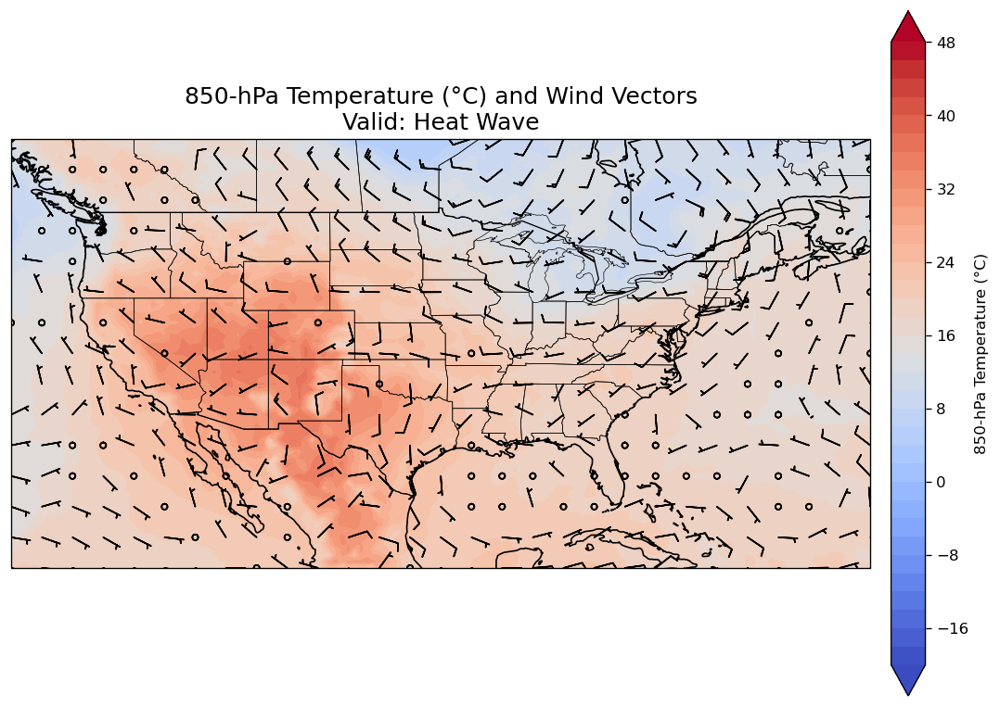

In [29]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

def plot_850_heatwave(t850, u850, v850, lon, lat, timestamp):
    proj = ccrs.PlateCarree()

    fig = plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=proj)

    ax.set_extent([-130, -60, 20, 55], crs=proj)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.8)
    ax.add_feature(cfeature.STATES, linewidth=0.4)

    # Filled Contour - Temperature in °C
    cf = ax.contourf(lon, lat, t850, levels=range(-20, 50, 2),
                     cmap='coolwarm', extend='both', transform=proj)

    # Wind barbs
    ax.barbs(lon[::5], lat[::5],
             u850[::5, ::5], v850[::5, ::5],
             length=5, transform=proj)

    plt.colorbar(cf, ax=ax, orientation="vertical",
                 pad=0.02, label="850-hPa Temperature (°C)")

    ax.set_title(f"850-hPa Temperature (°C) and Wind Vectors\nValid: {timestamp}",
                 fontsize=15)
    plt.savefig(
    "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/figures/Case 2 output/850_{timestamp}.png",
    dpi=300,
    bbox_inches="tight"
)
    plt.show()

# Plot
plot_850_heatwave(t850_2, u850_2, v850_2, lon_2, lat_2, "Heat Wave")


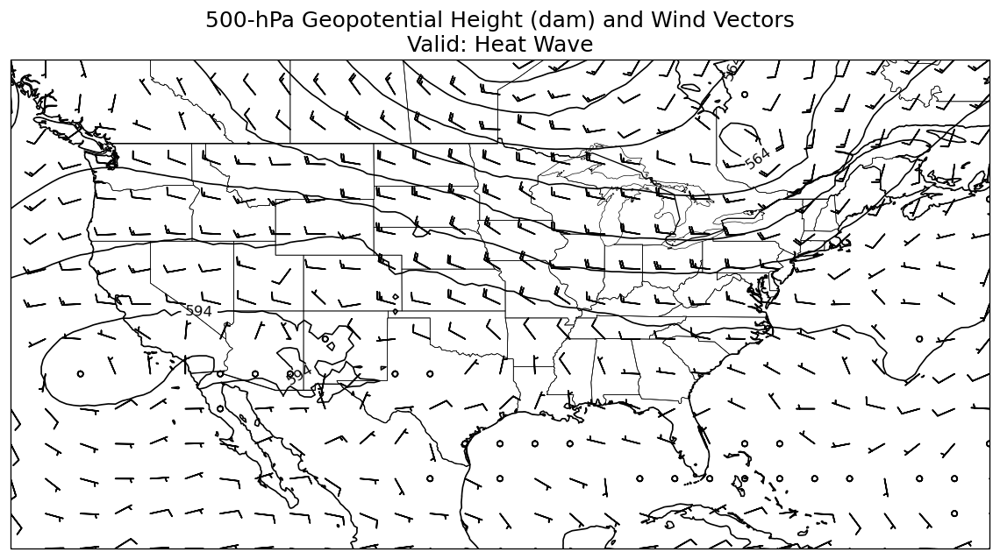

In [36]:
def plot_500_height_wind(gh500, u500, v500, lon, lat, timestamp):
    proj = ccrs.PlateCarree()

    fig = plt.figure(figsize=(12, 8))
    ax = plt.axes(projection=proj)

    ax.set_extent([-130, -60, 20, 55], crs=proj)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, linewidth=0.8)
    ax.add_feature(cfeature.STATES, linewidth=0.4)

    # Contour: Geopotential Height (dam)
    cs = ax.contour(lon, lat, gh500, levels=range(480, 600, 6),
                    colors='black', linewidths=1.0, transform=proj)
    ax.clabel(cs, inline=1, fontsize=10)

    # Wind barbs
    ax.barbs(lon[::5], lat[::5],
             u500[::5, ::5], v500[::5, ::5],
             length=5, transform=proj)

    ax.set_title(f"500-hPa Geopotential Height (dam) and Wind Vectors\nValid: {timestamp}",
                 fontsize=15)
    plt.savefig(
    "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/figures/Case 2 output/500_{timestamp}.png",
    dpi=300,
    bbox_inches="tight"
)

    plt.show()

# plot
plot_500_height_wind(gh500_2, u500_2, v500_2, lon_2, lat_2, "Heat Wave")


skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Found 12 files.
Processing: gfs_4_20230714_0000_000.grb2


<Figure size 960x720 with 0 Axes>

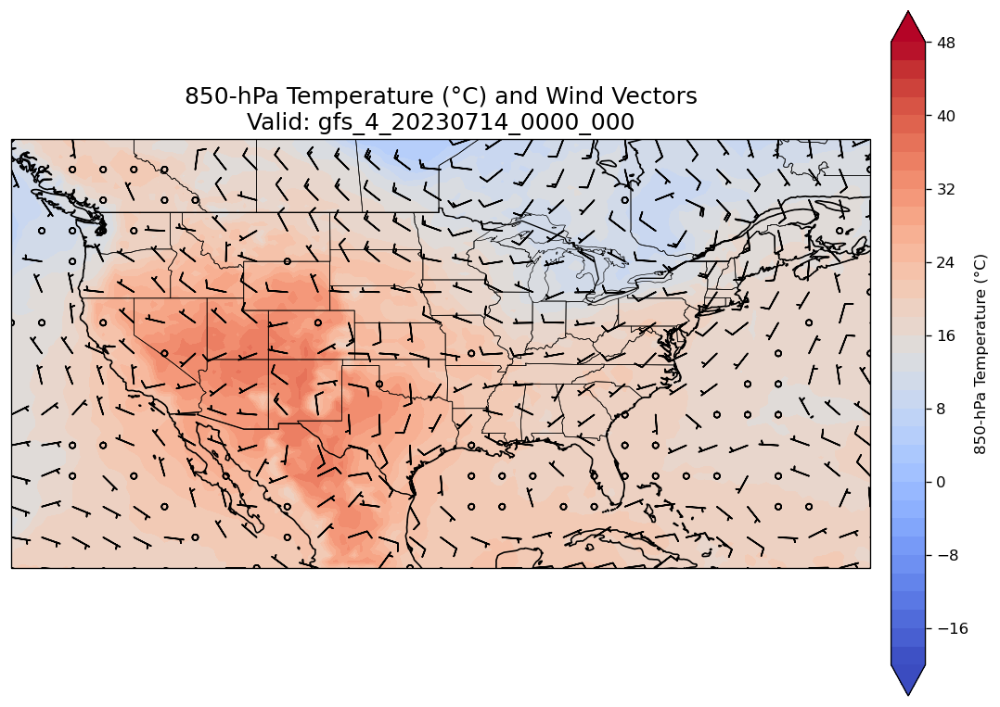

<Figure size 960x720 with 0 Axes>

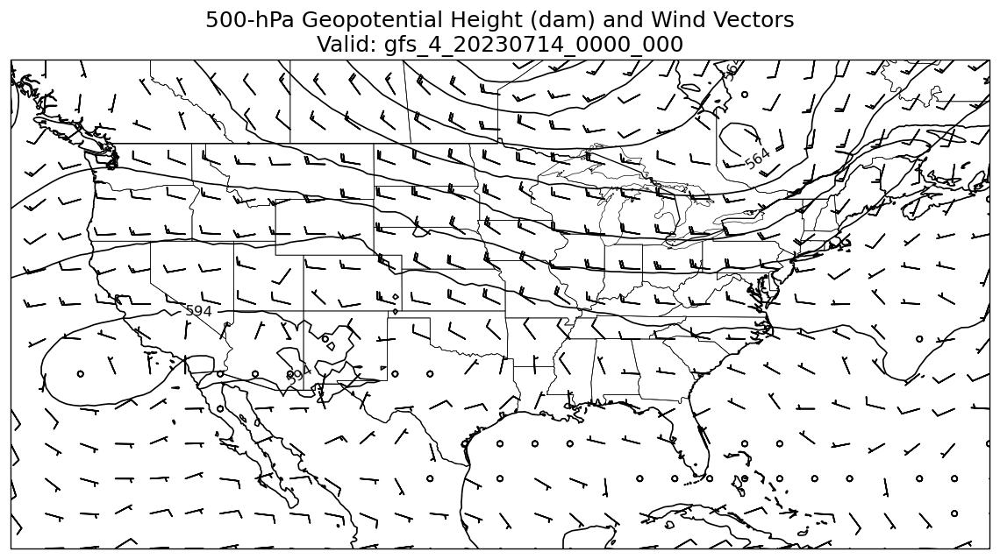

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230714_0600_000.grb2


<Figure size 960x720 with 0 Axes>

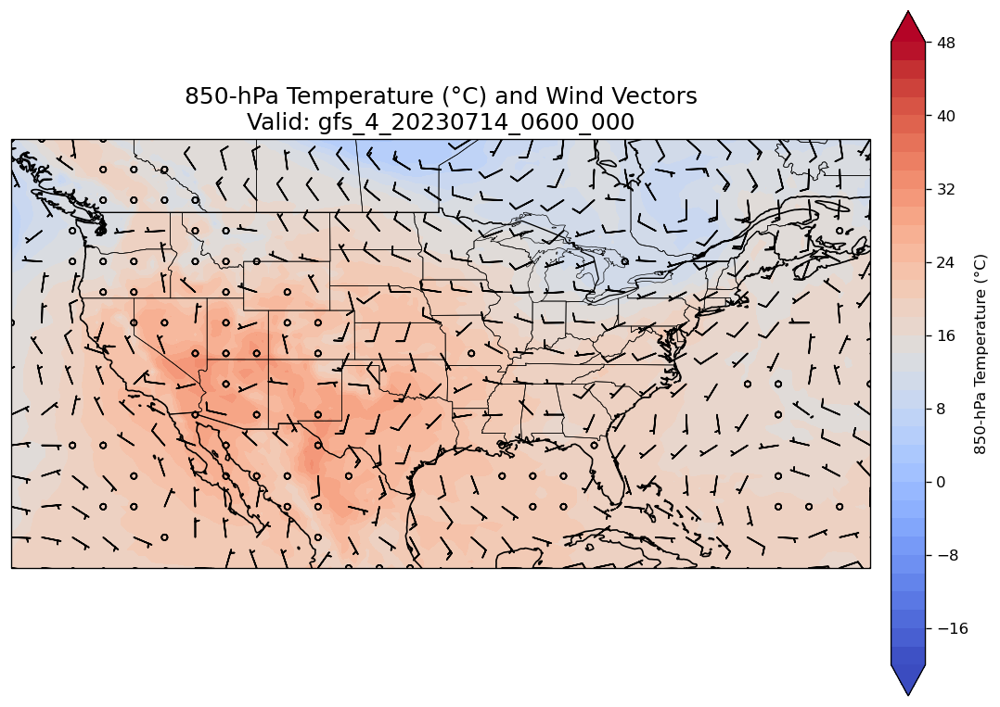

<Figure size 960x720 with 0 Axes>

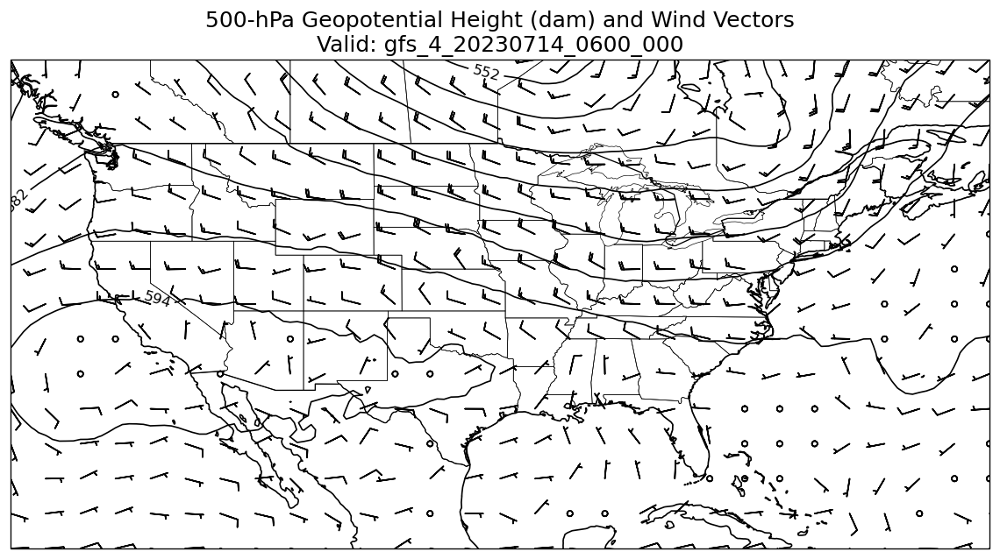

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230714_1200_000.grb2


<Figure size 960x720 with 0 Axes>

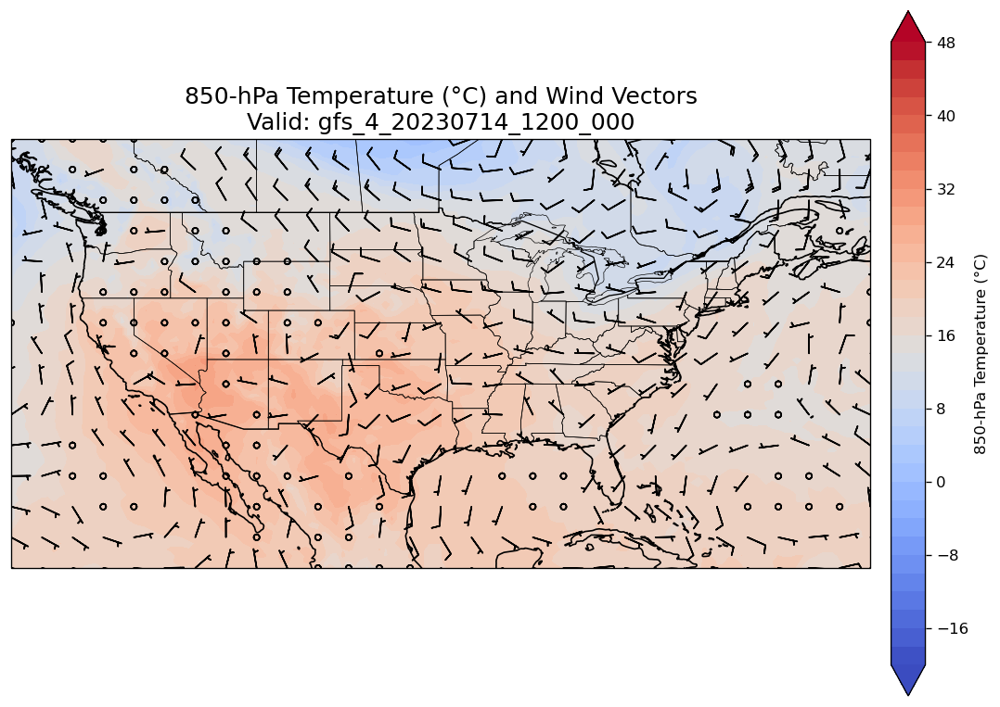

<Figure size 960x720 with 0 Axes>

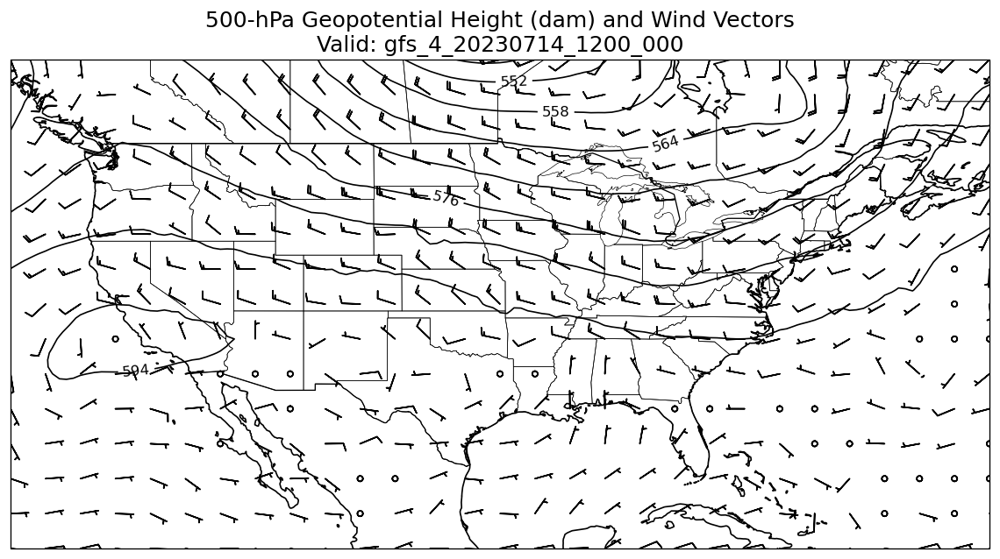

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230714_1800_000.grb2


<Figure size 960x720 with 0 Axes>

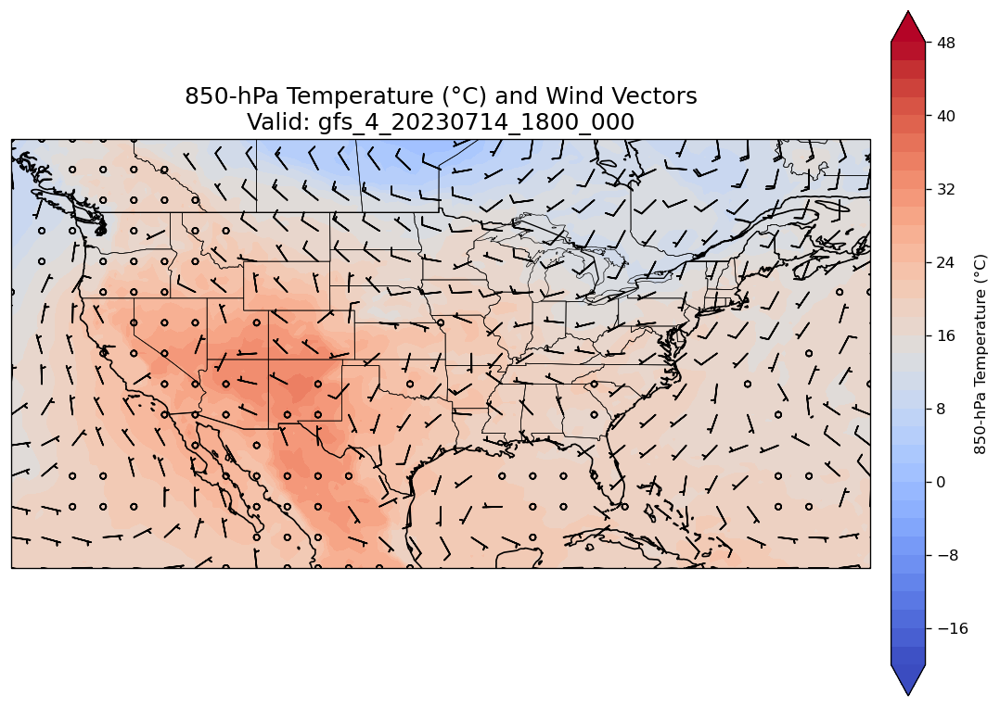

<Figure size 960x720 with 0 Axes>

<Figure size 960x720 with 0 Axes>

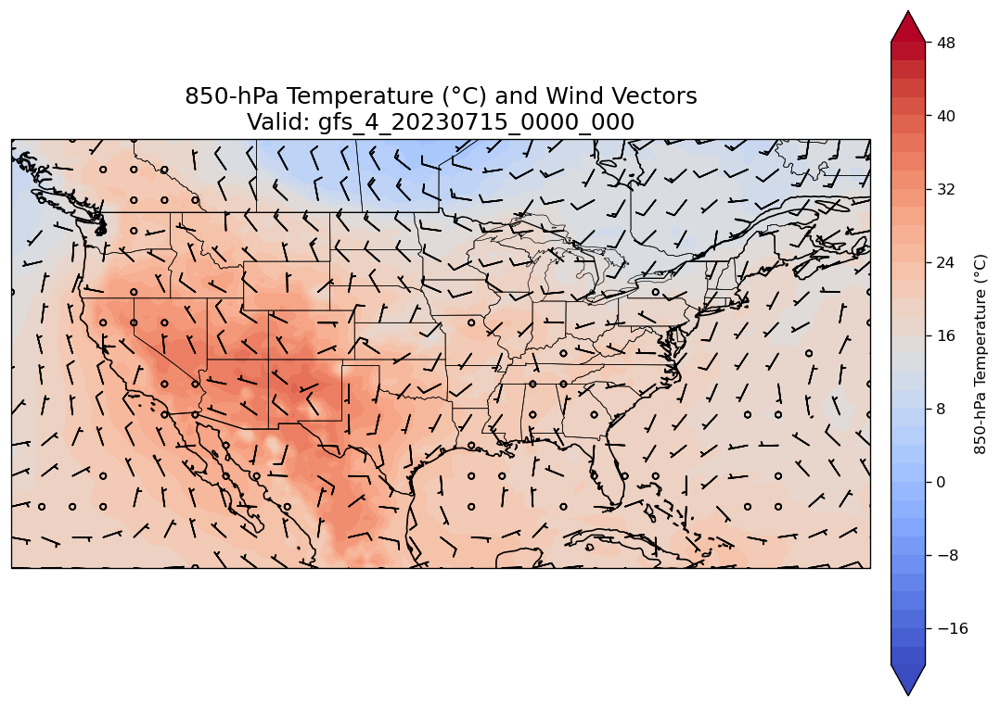

<Figure size 960x720 with 0 Axes>

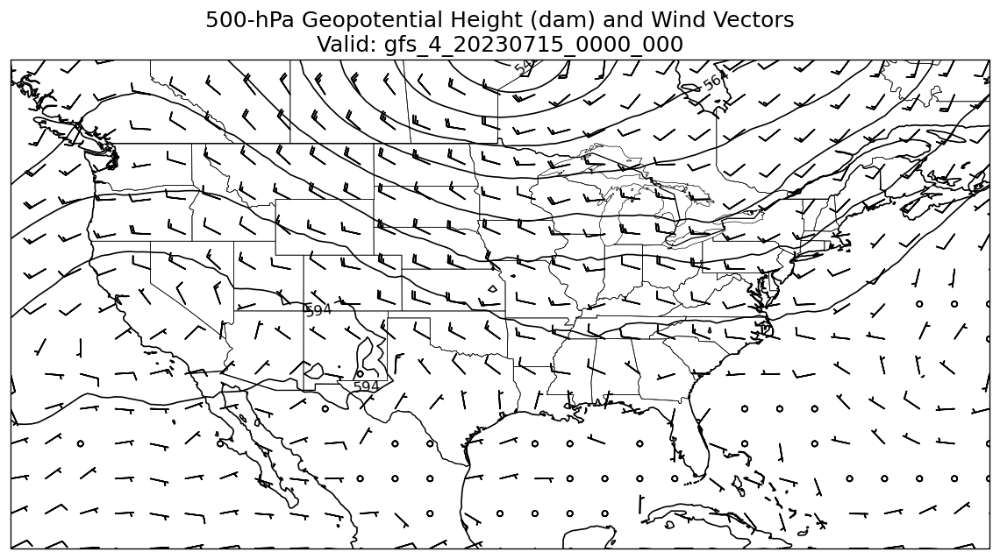

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230715_0600_000.grb2


<Figure size 960x720 with 0 Axes>

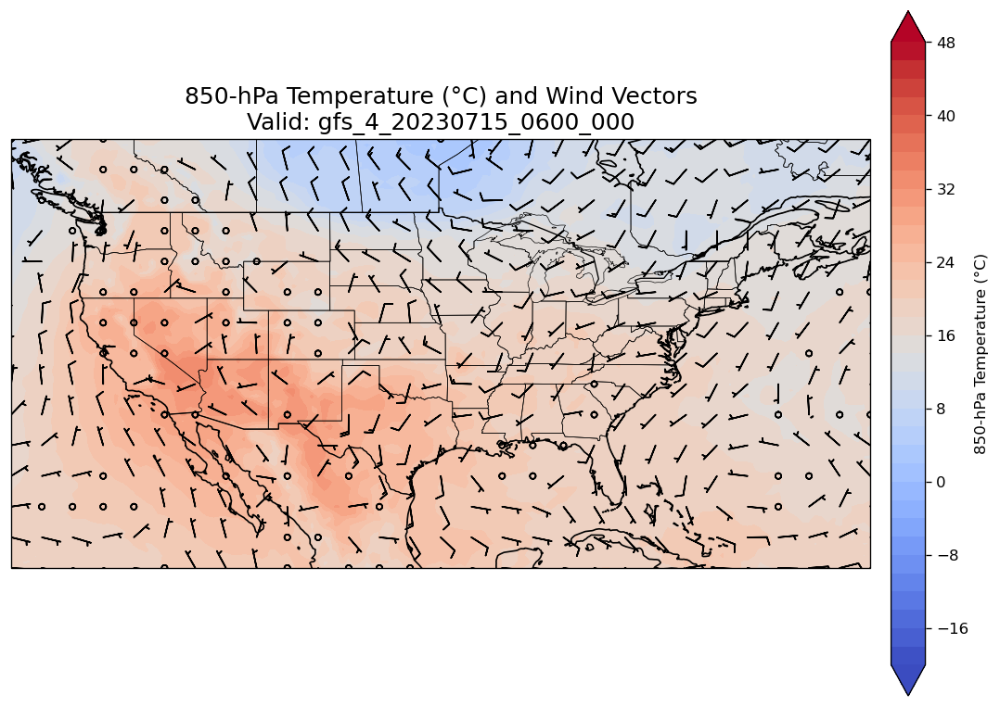

<Figure size 960x720 with 0 Axes>

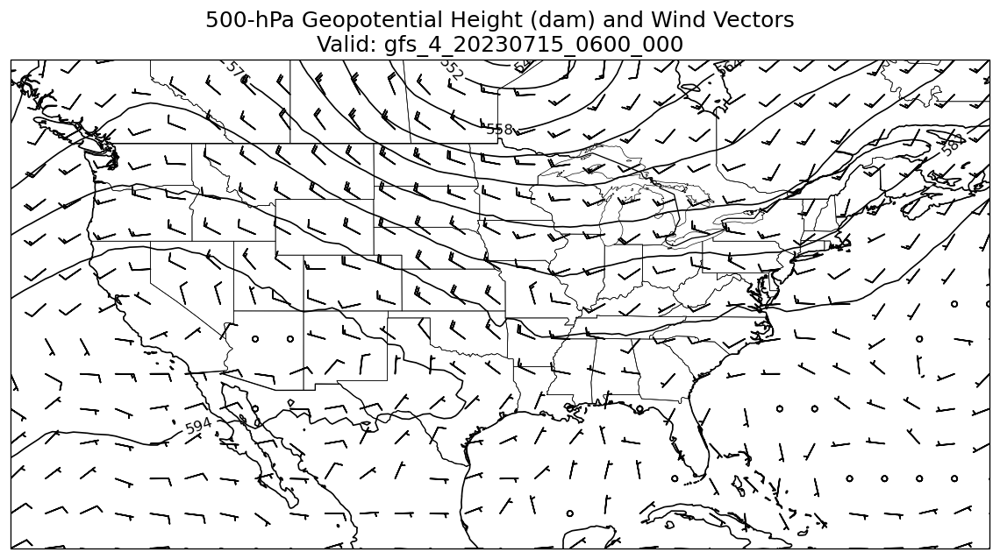

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230715_1200_000.grb2


<Figure size 960x720 with 0 Axes>

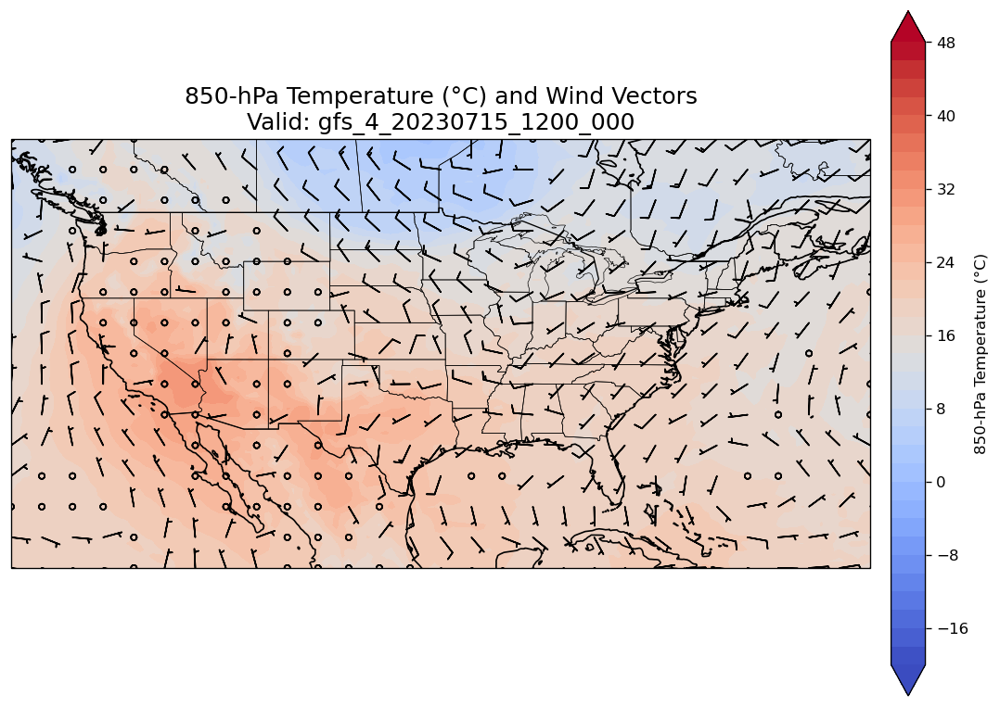

<Figure size 960x720 with 0 Axes>

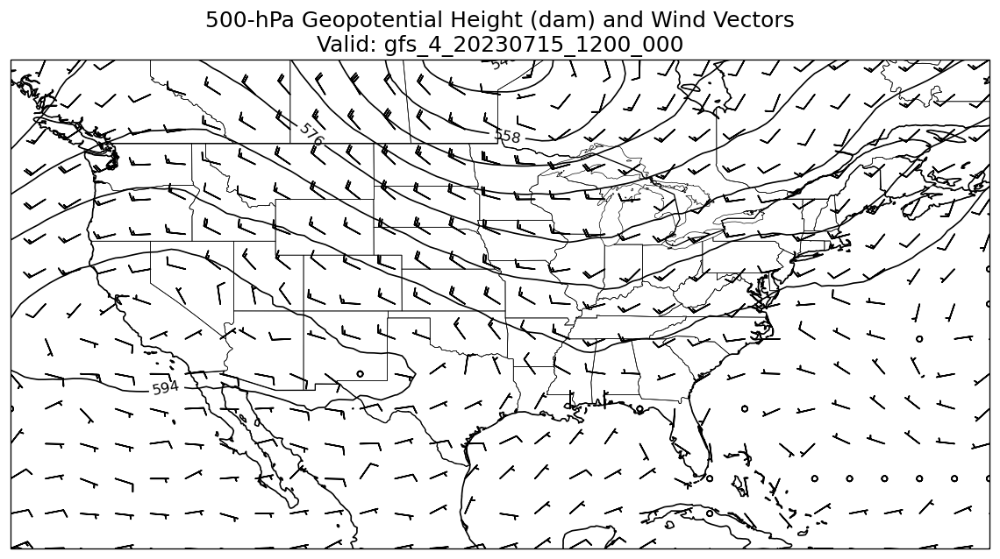

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230715_1800_000.grb2


<Figure size 960x720 with 0 Axes>

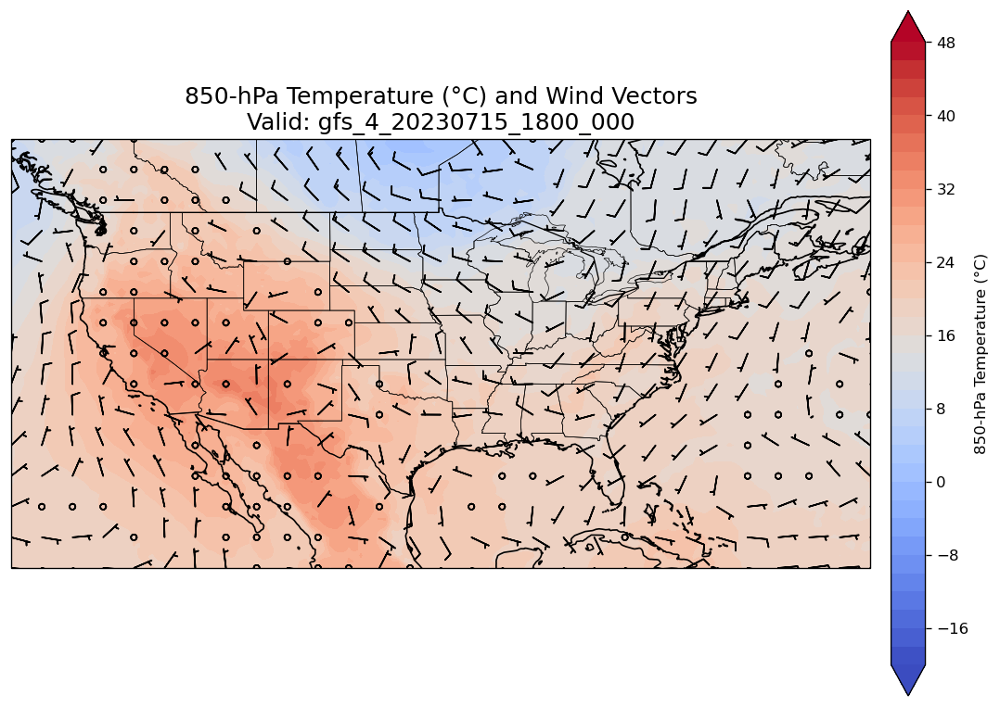

<Figure size 960x720 with 0 Axes>

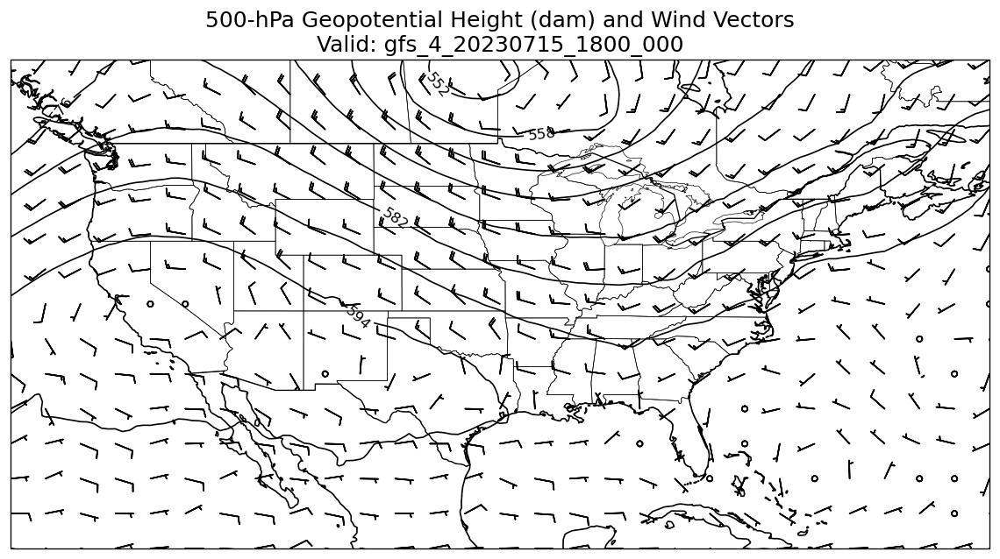

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230716_0000_000.grb2


<Figure size 960x720 with 0 Axes>

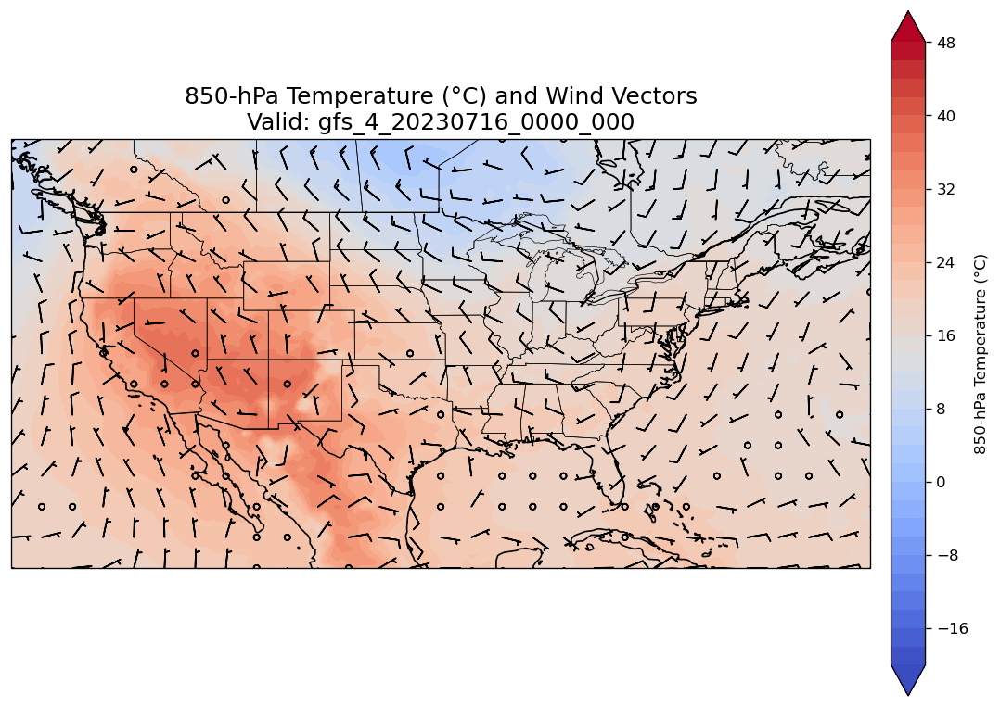

<Figure size 960x720 with 0 Axes>

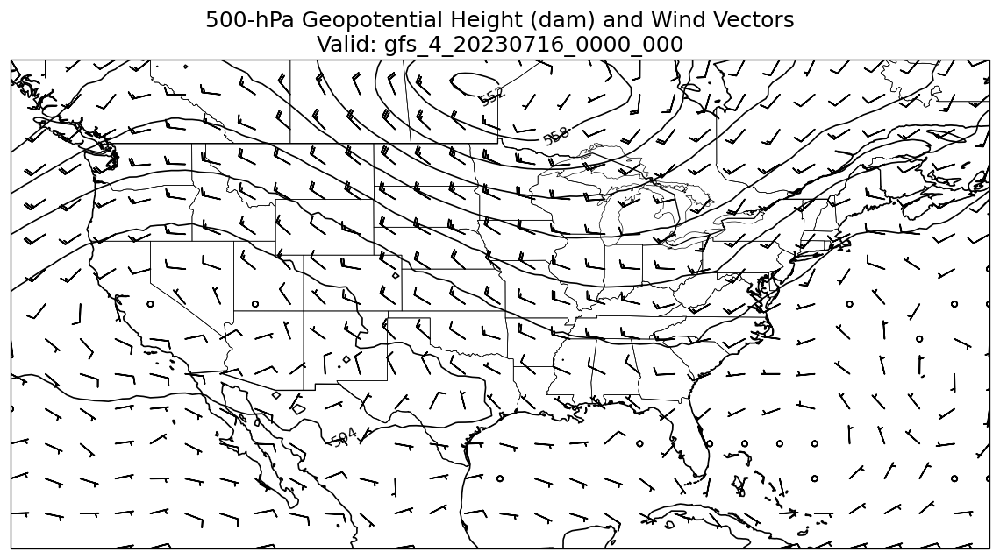

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230716_0600_000.grb2


<Figure size 960x720 with 0 Axes>

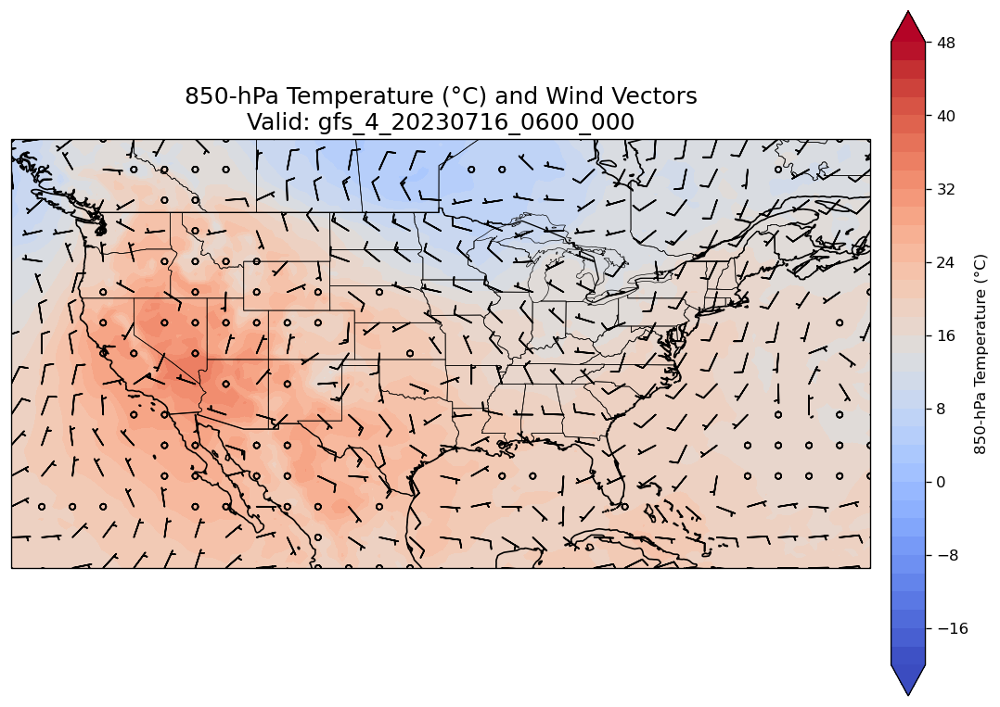

<Figure size 960x720 with 0 Axes>

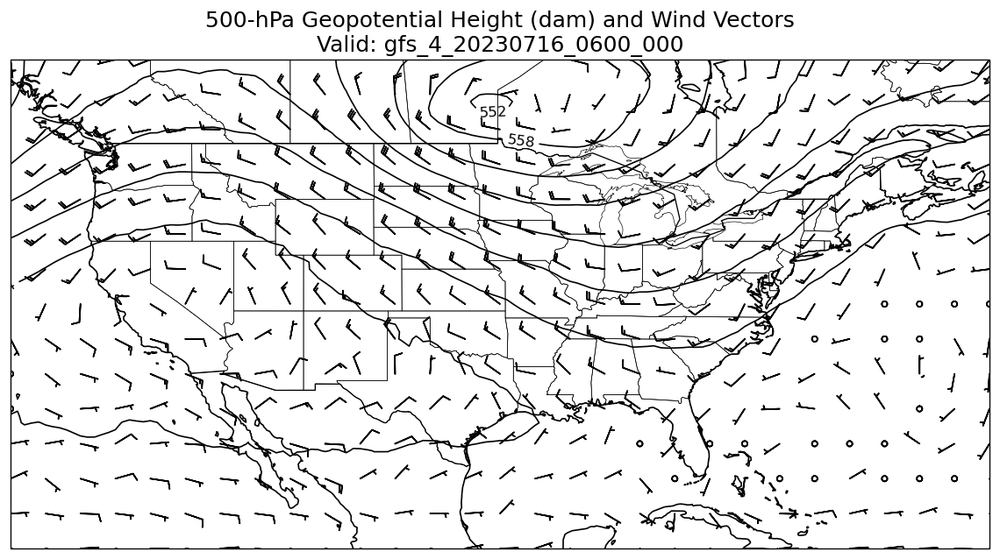

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230716_1200_000.grb2


<Figure size 960x720 with 0 Axes>

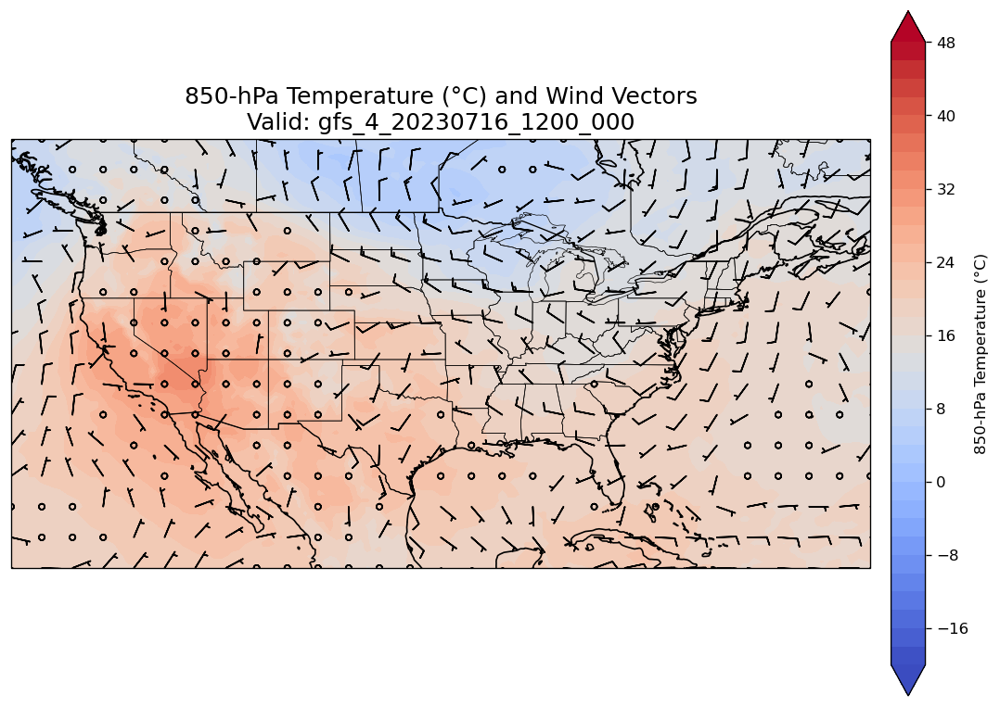

<Figure size 960x720 with 0 Axes>

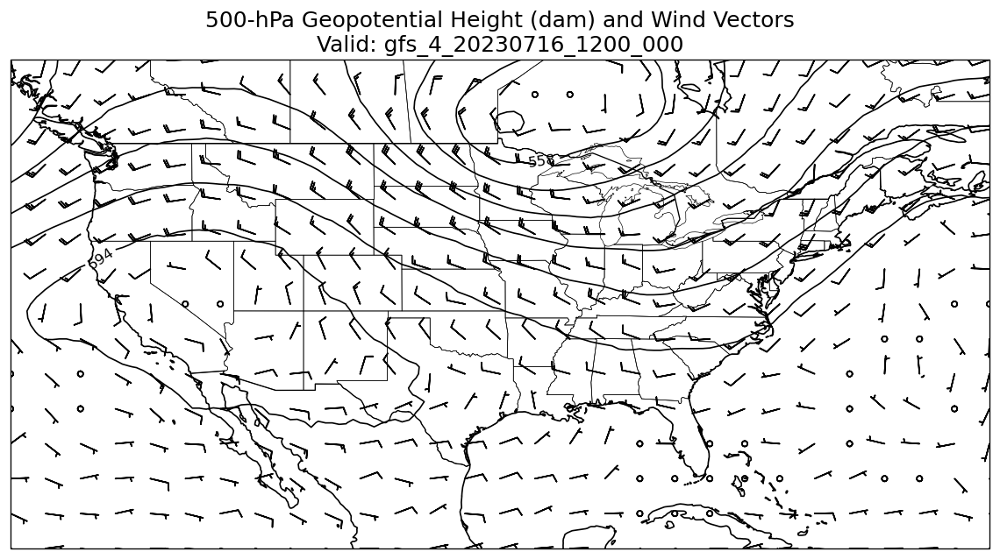

skipping variable: paramId==228164 shortName='tcc'
Traceback (most recent call last):
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 725, in build_dataset_components
    dict_merge(variables, coord_vars)
  File "/knight/jan25/envs/jan25_env/lib/python3.12/site-packages/cfgrib/dataset.py", line 641, in dict_merge
    raise DatasetBuildError(
cfgrib.dataset.DatasetBuildError: key present and new value is different: key='isobaricInhPa' value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.,  150.,  100.,   70.,   50.,   40.,   30.,   20.,   15.,
         10.,    7.,    5.,    3.,    2.,    1.])) new_value=Variable(dimensions=('isobaricInhPa',), data=array([1000.,  975.,  950.,  925.,  900.,  850.,  800.,  750.,  700.,
        650.,  600.,  550.,  500.,  450.,  400.,  350.,  300.,  250.,
        200.

Processing: gfs_4_20230716_1800_000.grb2


<Figure size 960x720 with 0 Axes>

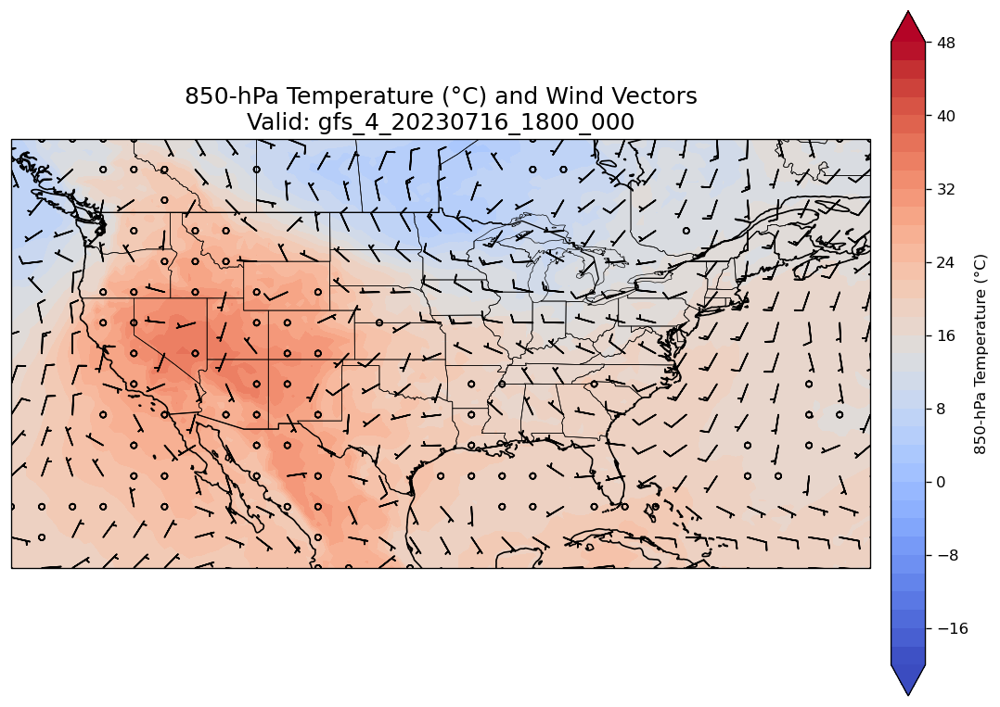

<Figure size 960x720 with 0 Axes>

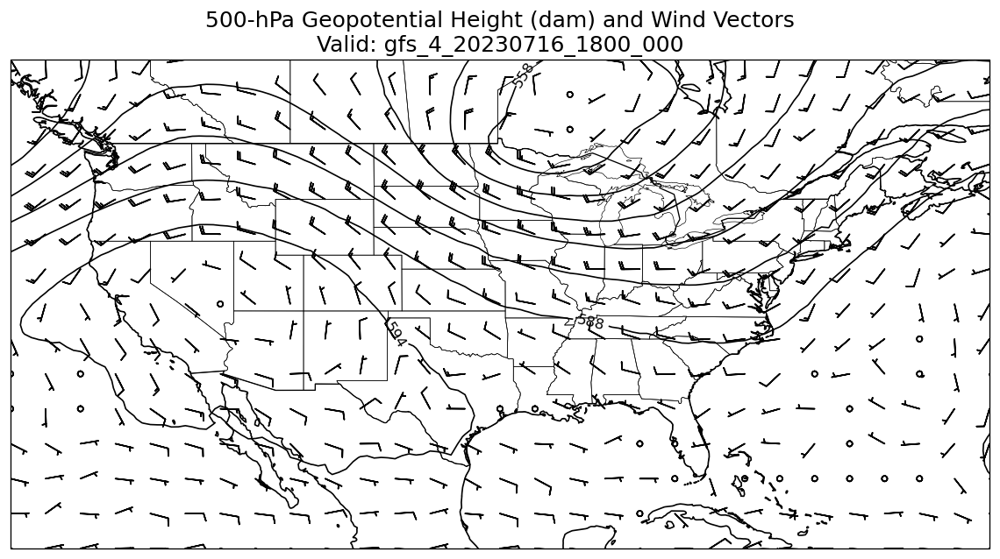

All plots saved!


In [37]:
import xarray as xr
import numpy as np
import glob
import os
import matplotlib.pyplot as plt

folder = "/nfs/spare11/atm533/tz248277/Scriptstorm/notebooks/Heat Wave"
output_folder = os.path.join(folder, "output")
os.makedirs(output_folder, exist_ok=True)

files = sorted(glob.glob(os.path.join(folder, "*.grb2")))
backend_opts = {"filter_by_keys": {"typeOfLevel": "isobaricInhPa"}}

print(f"Found {len(files)} files.")

for f in files:
    print("Processing:", os.path.basename(f))
    
    ds = xr.open_dataset(f, engine="cfgrib", backend_kwargs=backend_opts)

    # Extract 850
    t850 = ds["t"].sel(isobaricInhPa=850) - 273.15
    u850 = ds["u"].sel(isobaricInhPa=850)
    v850 = ds["v"].sel(isobaricInhPa=850)

    # Extract 500
    gh500 = ds["gh"].sel(isobaricInhPa=500) / 10.0
    u500 = ds["u"].sel(isobaricInhPa=500)
    v500 = ds["v"].sel(isobaricInhPa=500)

    lat = ds["latitude"]
    lon = ds["longitude"]

    ts = os.path.basename(f).replace(".grb2", "")

    
    #   Save 850 plot
    plt.figure()  # create new figure
    plot_850_heatwave(t850, u850, v850, lon, lat, ts, output_folder)
    
    plt.close()


    #   Save 500 plot
    plt.figure()  # create new figure
    plot_500_height_wind(gh500, u500, v500, lon, lat, ts, output_folder)
    
    plt.close()

    ds.close()

print("All plots saved!")



## 3.Synoptic Analysis

During 14–16 July 2023, a strong 500-hPa ridge and associated heat dome over the southwestern and central United States maintained weak, subsident flow aloft while supporting a broad 850-hPa warm tongue with temperatures above 20–25 °C, and the combination of persistent upper-level high pressure, continued low-level warm advection from northern Mexico and the Desert Southwest, and weak winds that limited horizontal mixing allowed extreme heat to build and linger across the Southwest and southern Plains, producing a prolonged and dangerous heat wave.


## Case 3: Super Tornado Outbreak (26–27 April 2011)

GFS Evaluation of the Synoptic Environment During the 2011 Super Outbreak

## 1. Background

From 26–27 April 2011, a historic tornado outbreak impacted the southeastern United States, producing over 300 tornadoes within a two-day period and causing catastrophic damage across Alabama, Mississippi, Tennessee, and Georgia. This event is considered one of the most violent tornado outbreaks in U.S. history, featuring numerous long-track EF4 and EF5 tornadoes.

The outbreak occurred under a classic large-scale severe-weather setup: a deep mid-latitude trough moving across the central U.S., an intense low-level jet transporting warm, moist air from the Gulf of Mexico, and extreme wind shear favorable for supercells. Unlike lake-effect snowbands, tornado outbreaks are strongly tied to synoptic-scale dynamics combined with mesoscale convective processes.

This case is an ideal test for model performance because GFS forecast fields can capture the broader synoptic pattern but often struggle with mesoscale details critical for tornadogenesis. In this study, I evaluate how well GFS represents the synoptic environment that supported the 2011 Super Outbreak.

## 2. Data and Method

For this case, I use 1° NCEP FNL (Final) Operational Global Analysis fields rather than GFS forecast runs. This is because archived GFS forecasts for April 2011 are incomplete on NOMADS, while the FNL analysis provides a continuous and reliable dataset with 6-hour temporal resolution.

The files used for this analysis include:

fnl_20110426_00_00.grib2

fnl_20110426_06_00.grib2

fnl_20110426_12_00.grib2

fnl_20110426_18_00.grib2

fnl_20110427_00_00.grib2

fnl_20110427_06_00.grib2

fnl_20110427_12_00.grib2

fnl_20110427_18_00.grib2

These files contain global atmospheric analysis fields at a horizontal resolution of 1°, including pressure-level variables, near-surface fields, and flux terms.

I focus on the following variables that are most relevant for severe convection:

* 500-hPa geopotential height and wind (upper-level trough strength and jet structure)

* 850-hPa temperature, moisture, and wind (low-level jet and warm-sector air mass)

* Sea-level pressure (SLP) (synoptic pressure pattern)

Using these fields, I analyze the large-scale synoptic environment that contributed to the development of extreme shear, instability, and lift during the Super Outbreak.

In [38]:
data_dir = Path("Tornado")
fnl_files = sorted(data_dir.glob("fnl_201104*.grib2"))
fnl_files

[PosixPath('Tornado/fnl_20110426_00_00.grib2'),
 PosixPath('Tornado/fnl_20110426_06_00.grib2'),
 PosixPath('Tornado/fnl_20110426_12_00.grib2'),
 PosixPath('Tornado/fnl_20110426_18_00.grib2'),
 PosixPath('Tornado/fnl_20110427_00_00.grib2'),
 PosixPath('Tornado/fnl_20110427_06_00.grib2'),
 PosixPath('Tornado/fnl_20110427_12_00.grib2'),
 PosixPath('Tornado/fnl_20110427_18_00.grib2')]

In [46]:
# The required parameters for the query are located in the folder.
fname = "Tornado/fnl_20110426_00_00.grib2"

import pygrib
with pygrib.open(fname) as grbs:
    levels = set()
    for g in grbs:
        levels.add((g.typeOfLevel, g.level))

levels

{('atmosphereSingleLayer', 0),
 ('convectiveCloudLayer', 0),
 ('depthBelowLandLayer', 0),
 ('depthBelowLandLayer', 1),
 ('heightAboveGround', 2),
 ('heightAboveGround', 10),
 ('heightAboveSea', 1829),
 ('heightAboveSea', 2743),
 ('heightAboveSea', 3658),
 ('highestTroposphericFreezing', 0),
 ('isobaricInhPa', 10),
 ('isobaricInhPa', 20),
 ('isobaricInhPa', 30),
 ('isobaricInhPa', 50),
 ('isobaricInhPa', 70),
 ('isobaricInhPa', 100),
 ('isobaricInhPa', 150),
 ('isobaricInhPa', 200),
 ('isobaricInhPa', 250),
 ('isobaricInhPa', 300),
 ('isobaricInhPa', 350),
 ('isobaricInhPa', 400),
 ('isobaricInhPa', 450),
 ('isobaricInhPa', 500),
 ('isobaricInhPa', 550),
 ('isobaricInhPa', 600),
 ('isobaricInhPa', 650),
 ('isobaricInhPa', 700),
 ('isobaricInhPa', 750),
 ('isobaricInhPa', 800),
 ('isobaricInhPa', 850),
 ('isobaricInhPa', 900),
 ('isobaricInhPa', 925),
 ('isobaricInhPa', 950),
 ('isobaricInhPa', 975),
 ('isobaricInhPa', 1000),
 ('isothermZero', 0),
 ('maxWind', 0),
 ('meanSea', 0),
 ('pot

In [40]:
def open_fnl_isobaric(level, files):
    """
    level : int, e.g. 500, 850
    files : iterable of Path objects
    """
    ds_list = []

    for f in files:
        print("Reading", f.name, "level", level)
        # typeOfLevel + level
        ds = xr.open_dataset(
            f,
            engine="cfgrib",
            backend_kwargs={
                "filter_by_keys": {
                    "typeOfLevel": "isobaricInhPa",
                    "level": level
                }
            }
        )

        # FNL typically has only one time step; expanding the time scalar into dimensions facilitates concatenation.
        time_name = "time" if "time" in ds.coords else "valid_time"
        tval = ds[time_name].values
        ds = ds.expand_dims({"time": [tval]})  # New time dimension

        ds_list.append(ds)

    # Merge all time series on the time dimension
    ds_all = xr.concat(ds_list, dim="time")
    return ds_all


In [41]:
ds_500 = open_fnl_isobaric(500, fnl_files)
ds_850 = open_fnl_isobaric(850, fnl_files)

Reading fnl_20110426_00_00.grib2 level 500
Reading fnl_20110426_06_00.grib2 level 500
Reading fnl_20110426_12_00.grib2 level 500
Reading fnl_20110426_18_00.grib2 level 500
Reading fnl_20110427_00_00.grib2 level 500
Reading fnl_20110427_06_00.grib2 level 500
Reading fnl_20110427_12_00.grib2 level 500
Reading fnl_20110427_18_00.grib2 level 500
Reading fnl_20110426_00_00.grib2 level 850
Reading fnl_20110426_06_00.grib2 level 850
Reading fnl_20110426_12_00.grib2 level 850
Reading fnl_20110426_18_00.grib2 level 850
Reading fnl_20110427_00_00.grib2 level 850
Reading fnl_20110427_06_00.grib2 level 850
Reading fnl_20110427_12_00.grib2 level 850
Reading fnl_20110427_18_00.grib2 level 850


In [47]:
def open_fnl_surface(files):
    ds_list = []
    for f in files:
        print("Reading", f.name, "surface")
        ds = xr.open_dataset(
            f,
            engine="cfgrib",
            backend_kwargs={"filter_by_keys": {"typeOfLevel": "surface"}}
        )

        time_name = "time" if "time" in ds.coords else "valid_time"
        tval = ds[time_name].values
        ds = ds.expand_dims({"time": [tval]})

        ds_list.append(ds)

    ds_all = xr.concat(ds_list, dim="time")
    return ds_all

ds_sfc = open_fnl_surface(fnl_files)


Reading fnl_20110426_00_00.grib2 surface
Reading fnl_20110426_06_00.grib2 surface
Reading fnl_20110426_12_00.grib2 surface
Reading fnl_20110426_18_00.grib2 surface
Reading fnl_20110427_00_00.grib2 surface
Reading fnl_20110427_06_00.grib2 surface
Reading fnl_20110427_12_00.grib2 surface
Reading fnl_20110427_18_00.grib2 surface


In [48]:
def subset_se_us(ds):
    """
    Select an area roughly covering the southeastern United States:
    lat: 25–40N, lon: 260–290E (approximately equivalent to 100–70W)
    """
    return ds.sel(
        latitude=slice(40, 25),        
        longitude=slice(260, 290)
    )

ds_500_se = subset_se_us(ds_500)
ds_850_se = subset_se_us(ds_850)
ds_sfc_se = subset_se_us(ds_sfc)


In [49]:
def plot_500_hpa(ds, itime, title_extra=""):
    """
    500-hPa geopotential height (gpm) + wind (m/s)
    """

    # gh: geopotential height (gpm)，u/v: wind
    Z = ds["gh"].isel(time=itime)        
    u = ds["u"].isel(time=itime)
    v = ds["v"].isel(time=itime)

    tval = np.datetime_as_string(ds.time[itime].values, unit="h")

    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={"projection": proj})

    # Location: Southeastern United States / Tornado Belt
    ax.set_extent([260, 290, 25, 40], crs=proj)
    ax.coastlines()
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)

    # 500 hPa Potential Height Contour Lines
    cs = ax.contour(
        ds.longitude,
        ds.latitude,
        Z,
        levels=np.arange(5000, 6000, 60),   # 60 gpm 间隔可调
        colors="black",
        linewidths=1.0,
        transform=proj,
    )
    ax.clabel(cs, inline=True, fontsize=8)

    # Wind Vector
    skip = (slice(None, None, 3), slice(None, None, 3))
    Q = ax.quiver(
        ds.longitude[skip[1]], ds.latitude[skip[0]],
        u.values[skip], v.values[skip],
        color="black",
        pivot="middle",
        scale=500,           # Arrow Length Control
        width=0.002,
        headwidth=3,
        headlength=4,
        transform=proj,
    )

    # Wind Speed Scale
    ax.quiverkey(
        Q, 0.92, -0.1, 20, "20 m/s",
        coordinates="axes",
        labelpos="E",
        fontproperties={"size": 8}
    )

    ax.set_title(
        f"500-hPa Geopotential Height (dam) and Wind Vectors\n"
        f"Valid at {tval} UTC {title_extra}",
        fontsize=12
    )
    plt.savefig(f"500hpa_{tval}.png", dpi=300, bbox_inches="tight")
    plt.show()


def plot_850_hpa(ds, itime, title_extra=""):
    """
    850 hPa Temperature (°C) + Wind Vector (professional style)
    """
    T = ds["t"].isel(time=itime) - 273.15
    u = ds["u"].isel(time=itime)
    v = ds["v"].isel(time=itime)
    tval = np.datetime_as_string(ds.time[itime].values, unit="h")

    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={"projection": proj})

    ax.set_extent([260, 290, 25, 40], crs=proj)
    ax.coastlines()
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)

    # Temperature shading
    cf = ax.contourf(
        ds.longitude, ds.latitude, T,
        levels=np.arange(-10, 30, 2),
        extend="both",
        cmap="coolwarm",
        transform=proj
    )
    plt.colorbar(cf, ax=ax, orientation="vertical", label="°C")

    # Wind vectors 
    skip = (slice(None, None, 3), slice(None, None, 3))
    Q = ax.quiver(
        ds.longitude[skip[1]], ds.latitude[skip[0]],
        u.values[skip], v.values[skip],
        color="black",       # professional
        pivot="middle",      # arrow pivot style
        scale=500,           # control arrow length
        width=0.002,         # thin arrows
        headwidth=3,
        headlength=4,
        transform=proj
    )

    # Quiver key
    ax.quiverkey(
        Q, 0.92, -0.1, 10, "10 m/s",
        coordinates="axes",
        labelpos="E",
        fontproperties={"size": 8}
    )

    ax.set_title(
        f"850-hPa Temperature (°C) and Wind Vectors\n"
        f"Valid at {tval} UTC {title_extra}"
    )
    plt.savefig(f"850hpa_{tval}.png", dpi=300, bbox_inches="tight")
    plt.show()

def plot_mslp(ds, itime, title_extra=""):
    """
    Plot Mean Sea Level Pressure (MSLP)
    """

    # Surface pressure (Pa → hPa)
    mslp = ds["sp"].isel(time=itime) / 100  

    # Time
    tval = np.datetime_as_string(ds.time[itime].values, unit="h")

    # Map set
    proj = ccrs.PlateCarree()
    fig, ax = plt.subplots(figsize=(8, 6), subplot_kw={"projection": proj})

    # Based on the midwestern United States
    ax.set_extent([260, 290, 25, 40], crs=proj)  
    ax.coastlines()
    ax.add_feature(cfeature.STATES, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.5)

    # Draw contour lines
    cs = ax.contour(
        ds.longitude,
        ds.latitude,
        mslp,
        levels=np.arange(980, 1025, 2),
        colors="k",
        linewidths=1,
        transform=proj
    )
    ax.clabel(cs, inline=True, fontsize=8)

    # title
    ax.set_title(
        f"Mean Sea-Level Pressure (hPa)\nValid at {tval} UTC {title_extra}"
    )
    plt.savefig(f"mslp_{tval}.png", dpi=300, bbox_inches="tight")
    plt.show()

<xarray.DataArray 'time' (time: 8)> Size: 64B
array(['2011-04-26T00:00:00.000000000', '2011-04-26T06:00:00.000000000',
       '2011-04-26T12:00:00.000000000', '2011-04-26T18:00:00.000000000',
       '2011-04-27T00:00:00.000000000', '2011-04-27T06:00:00.000000000',
       '2011-04-27T12:00:00.000000000', '2011-04-27T18:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time           (time) datetime64[ns] 64B 2011-04-26 ... 2011-04-27T18:00:00
    step           timedelta64[ns] 8B 00:00:00
    isobaricInhPa  float64 8B 500.0
    valid_time     (time) datetime64[ns] 64B 2011-04-26 ... 2011-04-27T18:00:00


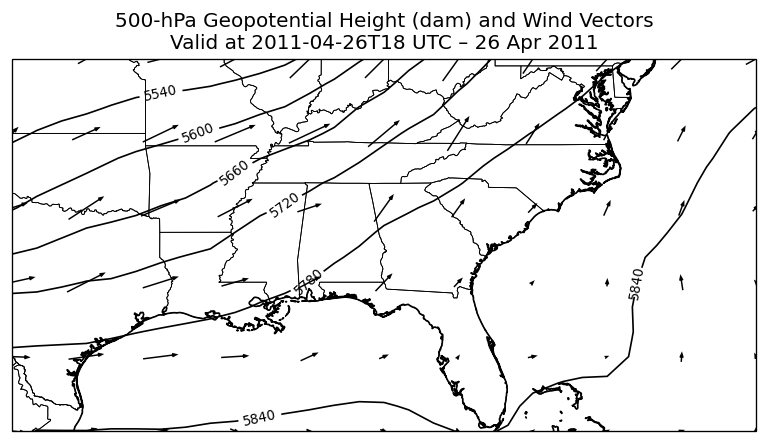

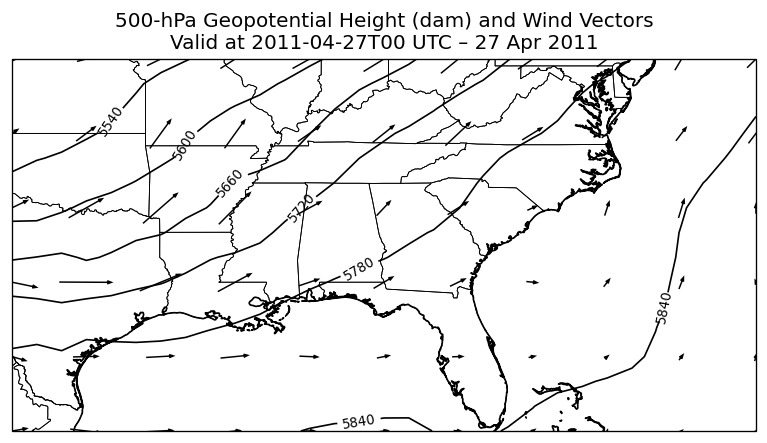

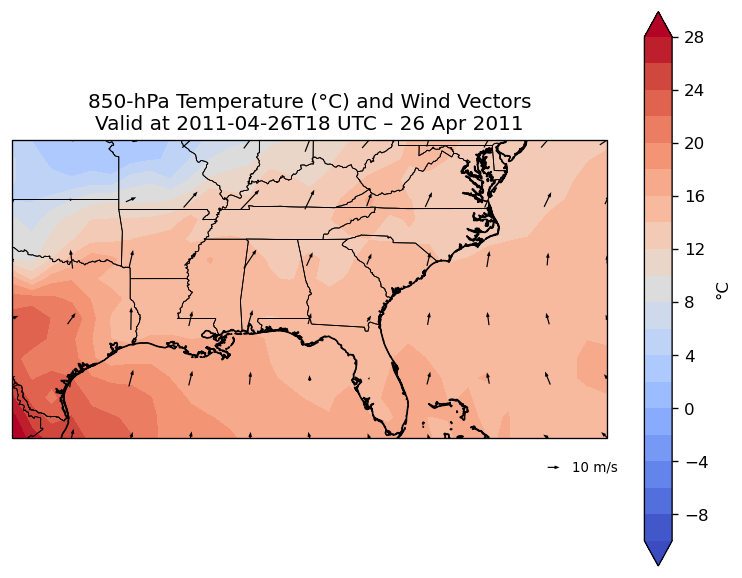

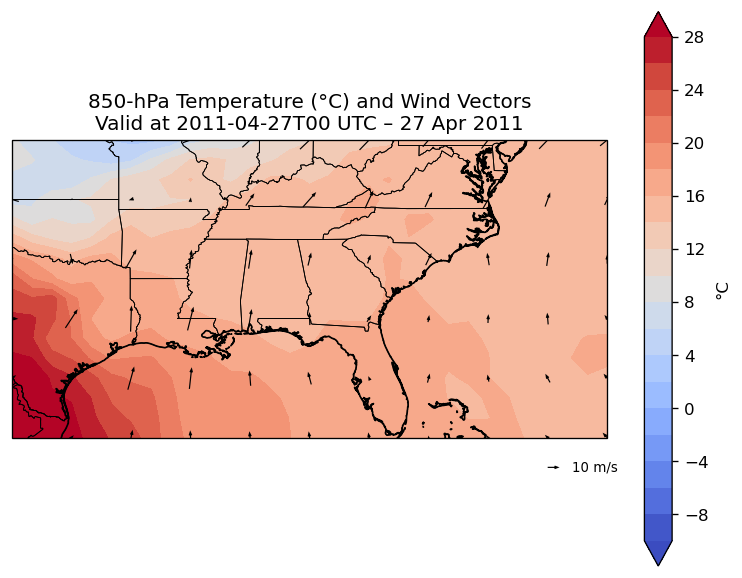

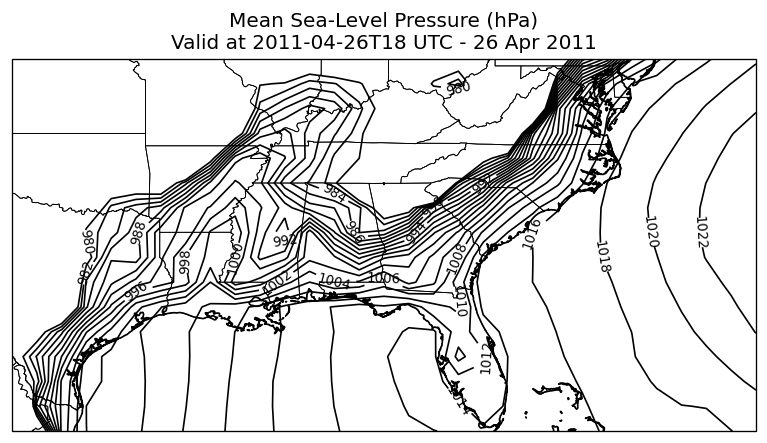

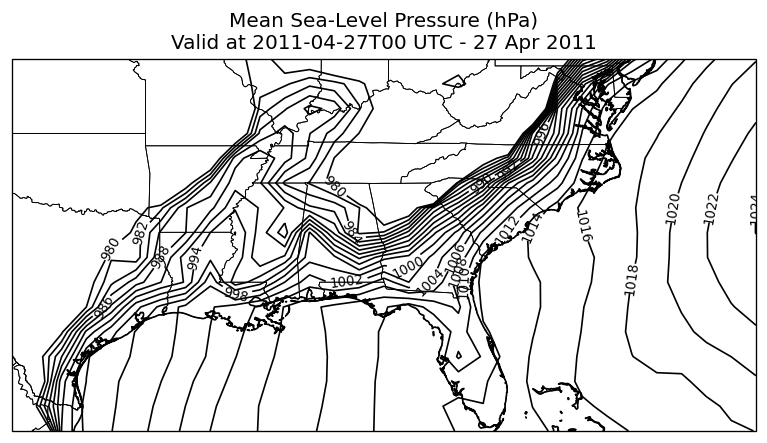

In [50]:
# Find the indices closest to 2011-04-26 18Z and 2011-04-27 00Z.
print(ds_500_se.time)

# Assuming index=3 corresponds to the 26th at 18Z, and index=4 corresponds to the 27th at 00Z.
itime1 = 3
itime2 = 4

plot_500_hpa(ds_500_se, itime1, title_extra="– 26 Apr 2011")
plot_500_hpa(ds_500_se, itime2, title_extra="– 27 Apr 2011")


plot_850_hpa(ds_850_se, itime1, title_extra="– 26 Apr 2011")
plot_850_hpa(ds_850_se, itime2, title_extra="– 27 Apr 2011")

plot_mslp(ds_sfc_se, itime1, title_extra="- 26 Apr 2011")
plot_mslp(ds_sfc_se, itime2, title_extra="- 27 Apr 2011")




## 3.Synoptic Analysis

### (1) 500-hPa Analysis

* A pronounced mid-level trough was located over the central U.S., extending into the Southeast.

* Tight height gradients indicate strong mid-level winds, supporting upper-level divergence ahead of the trough.

* This synoptic setup is favorable for lifting, destabilization, and the development of severe convection#

### (2) 850-hPa Temperature & Wind

* Strong southerly flow transported warm, moist air from the Gulf of Mexico.

* A low-level jet (LLJ) is clearly seen, enhancing moisture flux convergence in the Southeast.

* The warm advection ahead of the trough further destabilized the environment.

### (3) Surface MSLP

* A deep surface low-pressure system was centered in the Mississippi Valley.

* The strong pressure gradient supported high surface winds.

* The surface cyclone and associated frontal boundaries helped initiate convection.